<div class="alert alert-block alert-success">

## <center> Tracking Issues created for Repos on GitHub </center>
## <center> Plot and Forecast Issues </center>
    

</div>

<div class="alert alert-block alert-danger">
    
### Deliverables:
- Submit a single ZIP file  that has the folowing items:
    1. Your PDF document for the analysis report.
    2. Your IPYNB script with the name GitHub_Repos_Issues_Forecasting.ipynb that has your source code and output for the requirements listed
    2. Your HTML/PDF document that has your source code and output for the requirements listed

<br>
    
</div>

<hr style="border:2px solid black"> </hr>
<div class="alert alert-info">



        
## REQUIREMENT 1

Use Python/GitHub API to retrieve Issues/Repos information of the **past 2 months** for the following  repositories:
- https://github.com/meta-llama/llama3
- https://github.com/ollama/ollama
- https://github.com/langchain-ai/langchain
- https://github.com/langchain-ai/langgraph
- https://github.com/microsoft/autogen
- https://github.com/openai/openai-cookbook
- https://github.com/elastic/elasticsearch
- https://github.com/milvus-io/pymilvus


## Important: Data Retrieval Timeframe

 - For **chart visualizations below**, retrieve **past 2 years** of data.
 - For **semantic search and vector embeddings**, use **past 2 months** of data from the above repositories.

    
</div>



In [148]:
!pip install tensorflow pandas numpy requests matplotlib scikit-learn python-dateutil
!pip install pygithub
!pip install scikit-learn 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from github import Github
import requests
from datetime import datetime, timedelta
import time

In [ ]:
# Add github token here for sure.
GITHUB_TOKEN = ""
headers = {"Authorization": f"token {GITHUB_TOKEN}"}

REPOSITORY = [
    "meta-llama/llama3",
    "ollama/ollama",
    "langchain-ai/langchain",
    "langchain-ai/langgraph",
    "microsoft/autogen",
    "openai/openai-cookbook",
    "elastic/elasticsearch",
    "milvus-io/pymilvus"
]

end_date = datetime.now()
start_date = end_date - timedelta(days = 365 * 2)
print(365 * 2)

git = Github(GITHUB_TOKEN)

730


In [ ]:
def fetch_issues(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching issues for {repoName}")
    allIssues = repo.get_issues(state='all', since=start_date)
    issueObjects = []
    for issue in allIssues:
        issueObjects.append({
            'title': issue.title,
            'created_at': issue.created_at,
            'closed_at': issue.closed_at,
            'number': issue.number,
        })

    return issueObjects

# Fetching issues data for each repository
issues_data = {repo: fetch_issues(repo) for repo in REPOSITORY}

Fetching issues for meta-llama/llama3
Fetching issues for ollama/ollama
Fetching issues for langchain-ai/langchain
Fetching issues for langchain-ai/langgraph
Fetching issues for microsoft/autogen
Fetching issues for openai/openai-cookbook
Fetching issues for elastic/elasticsearch
Fetching issues for milvus-io/pymilvus


In [ ]:
issues_data

{'meta-llama/llama3': [{'title': 'A TEST file',
   'created_at': datetime.datetime(2025, 4, 15, 20, 30, 15, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 397},
  {'title': 'Difficulty Accessing Llama-3.1, 3.2, 3.3, and Llama 4.',
   'created_at': datetime.datetime(2025, 4, 8, 15, 31, 19, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 396},
  {'title': 'How to SFT llama3 with a labelled dataset',
   'created_at': datetime.datetime(2025, 3, 29, 8, 52, 49, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 395},
  {'title': 'Codespace musical space umbrella',
   'created_at': datetime.datetime(2025, 3, 27, 7, 48, 25, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 394},
  {'title': "llama model list keeps fail in a fresh env: module 'jsonschema' has no attribute 'Draft201909Validator",
   'created_at': datetime.datetime(2025, 3, 22, 7, 8, 51, tzinfo=datetime.timezone.utc),
   'closed_at': None,
   'number': 393},
  {'

In [ ]:
import csv

# Save issues data to a CSV
def save_issues_to_csv(issues_data, filename="issues_all_repo.csv"):

    for repo, issues in issues_data.items():
        print(len(issues))
        repoName = repo.replace("/", "_")
        fileName = f"issue_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=issues[0].keys())
            writer.writeheader()
            writer.writerows(issues)

    all_entries = []
    for repo, issues in issues_data.items():
        for issue in issues:
            entry = {"repository": repo, **issue}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved issues data to {filename}")

save_issues_to_csv(issues_data)

issues_df = pd.read_csv("issues_all_repo.csv")

row_count = issues_df.shape[0]
row_count


388
10125
21749
3226
5601
1382
37429
1426
Saved issues data to issues_all_repo.csv


81326

In [ ]:
starsDict = dict()
forkedDict = dict()

for repoName in REPOSITORY:
    repo = git.get_repo(repoName)
    starsDict[repoName] = repo.stargazers_count
    forkedDict[repoName] = repo.forks_count

print(starsDict)
print(forkedDict)

stars_df = pd.DataFrame(list(starsDict.items()), columns=["Repository", "Stars"])
forked_df = pd.DataFrame(list(forkedDict.items()), columns=["Repository", "Forks"])

stars_df.to_csv("all_repo_stars.csv", index = False)
forked_df.to_csv("all_repo_forkedIssues.csv", index = False)

{'meta-llama/llama3': 28631, 'ollama/ollama': 138123, 'langchain-ai/langchain': 106094, 'langchain-ai/langgraph': 11756, 'microsoft/autogen': 43492, 'openai/openai-cookbook': 63369, 'elastic/elasticsearch': 72430, 'milvus-io/pymilvus': 1159}
{'meta-llama/llama3': 3365, 'ollama/ollama': 11506, 'langchain-ai/langchain': 17235, 'langchain-ai/langgraph': 1953, 'microsoft/autogen': 6552, 'openai/openai-cookbook': 10293, 'elastic/elasticsearch': 25177, 'milvus-io/pymilvus': 350}


In [ ]:
from datetime import datetime, timedelta, timezone

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_pulls(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching pulls for {repoName}")
    allPulls = repo.get_pulls(state='all')
    print(f"Done pulls for {repoName}")
    allPullsObj = []

    for issue in allPulls:
        createdAt = issue.created_at.replace(tzinfo=None)
        if createdAt >= startDate:
            issue_created = issue.created_at.replace(tzinfo=None)
            closed_at = issue.closed_at.replace(tzinfo=None) if issue.closed_at else None
            merged_at = issue.merged_at.replace(tzinfo=None) if issue.merged_at else None

            allPullsObj.append({
                "repo": repoName,
                "pull_id": issue.id,
                'title': issue.title,
                'created_at': issue_created,
                'closed_at': closed_at,
                'merged_at': merged_at,
                'number': issue.number,
                'state': issue.state,
              })
    return allPullsObj

# Fetching issues data for each repository
pulls_data = {repo: fetch_pulls(repo) for repo in REPOSITORY}
print(pulls_data)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Save issues data to a CSV
def save_pulls_to_csv(pulls_data, filename="pulls_all_repo.csv"):

    for repo, issues in pulls_data.items():
        print(len(issues))
        repoName = repo.replace("/", "_")
        fileName = f"pulls_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=issues[0].keys())
            writer.writeheader()
            writer.writerows(issues)

    all_entries = []
    for repo, allPulls in pulls_data.items():
        for issue in allPulls:
            entry = {"repository": repo, **issue}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved allPulls data to {filename}")

save_pulls_to_csv(pulls_data)

pulls_df = pd.read_csv("pulls_all_repo.csv")
pulls_df.shape

99
3304
15391
2629
2913
865
24419
902
Saved allPulls data to pulls_all_repo.csv


(50522, 9)

In [ ]:
from datetime import datetime, timedelta, timezone

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_commits(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching pulls for {repoName}")
    allCommits = repo.get_commits(since = start_date, until = end_date)
    print(f"Done commits for {repoName}")
    allCommitsObj = []
    print(allCommits)
    for commit in allCommits:
        allCommitsObj.append({
            "repo": repoName,
            "commit_id": commit.sha,
            'commit_date': commit.commit.author.date
          })
    return allCommitsObj

# Fetching issues data for each repository
commited_data = {repo: fetch_commits(repo) for repo in REPOSITORY}
print(commited_data)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import csv

# Save commits data to a CSV
def save_commits_to_csv(commits_data, filename="commits_all_repo.csv"):

    for repo, commits in commits_data.items():
        print(len(commits))
        repoName = repo.replace("/", "_")
        fileName = f"commits_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=commits[0].keys())
            writer.writeheader()
            writer.writerows(commits)
        print(f"Commited to {fileName}")

    all_entries = []
    for repo, commits in commits_data.items():
        for issue in commits:
            entry = {"repository": repo, **issue}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved commits data to {filename}")

save_commits_to_csv(commited_data)

commits_df = pd.read_csv("commits_all_repo.csv")
commits_df.shape

132
Commited to commits_meta-llama_llama3.csv
4176
Commited to commits_ollama_ollama.csv
11749
Commited to commits_langchain-ai_langchain.csv
5029
Commited to commits_langchain-ai_langgraph.csv
2955
Commited to commits_microsoft_autogen.csv
689
Commited to commits_openai_openai-cookbook.csv
16866
Commited to commits_elastic_elasticsearch.csv
473
Commited to commits_milvus-io_pymilvus.csv
Saved commits data to commits_all_repo.csv


(42069, 4)

In [ ]:
## Branches

from datetime import datetime, timedelta, timezone

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_branches(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching branches for {repoName}")
    allbranches = repo.get_branches()
    print(f"Done branches for {repoName}")
    allBranchesObj = []
    print(allbranches)
    for branch in allbranches:
        branch_name = branch.name
        commit_sha = branch.commit.sha
        commit = branch.commit
        commit_date = commit.commit.author.date
        commitDate = commit_date.replace(tzinfo=None)
        if commitDate >= startDate:

            allBranchesObj.append({
                "repo": repoName,
                "branch_name": branch_name,
                "branch_commit_id": commit_sha,
                'commit_date': commitDate
              })
        pass
    return allBranchesObj

branch_data = {repo: fetch_branches(repo) for repo in REPOSITORY}
print(branch_data)

Fetching branches for meta-llama/llama3
Done branches for meta-llama/llama3
Fetching branches for ollama/ollama
Done branches for ollama/ollama
Fetching branches for langchain-ai/langchain
Done branches for langchain-ai/langchain
Fetching branches for langchain-ai/langgraph
Done branches for langchain-ai/langgraph
Fetching branches for microsoft/autogen
Done branches for microsoft/autogen
Fetching branches for openai/openai-cookbook
Done branches for openai/openai-cookbook
Fetching branches for elastic/elasticsearch
Done branches for elastic/elasticsearch
Fetching branches for milvus-io/pymilvus
Done branches for milvus-io/pymilvus
{'meta-llama/llama3': [{'repo': 'meta-llama/llama3', 'branch_name': 'gh/HDCharles/1/base', 'branch_commit_id': 'fa87cc3601463f3d0dce6b081e111865e362b622', 'commit_date': datetime.datetime(2024, 4, 5, 0, 24, 41)}, {'repo': 'meta-llama/llama3', 'branch_name': 'gh/HDCharles/1/head', 'branch_commit_id': 'd6a2e3cf19b22ccfbb03e4d3d23ca1853a03f954', 'commit_date': 

In [ ]:
import csv

# Save branches data to a CSV
def save_branches_to_csv(branches_data, filename="branches_all_repo.csv"):

    for repo, branches in branches_data.items():
        print(len(branches))
        repoName = repo.replace("/", "_")
        fileName = f"branches_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=branches[0].keys())
            writer.writeheader()
            writer.writerows(branches)
        print(f"branched to {fileName}")

    all_entries = []
    for repo, branches in branches_data.items():
        for branch in branches:
            entry = {"repository": repo, **branch}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved branches data to {filename}")

save_branches_to_csv(branch_data)

branches_df = pd.read_csv("branches_all_repo.csv")
branches_df.shape

19
branched to branches_meta-llama_llama3.csv
234
branched to branches_ollama_ollama.csv
784
branched to branches_langchain-ai_langchain.csv
151
branched to branches_langchain-ai_langgraph.csv
188
branched to branches_microsoft_autogen.csv
53
branched to branches_openai_openai-cookbook.csv
311
branched to branches_elastic_elasticsearch.csv
5
branched to branches_milvus-io_pymilvus.csv
Saved branches data to branches_all_repo.csv


(1745, 5)

In [ ]:
## Contributions

from datetime import datetime, timedelta, timezone

git = Github(GITHUB_TOKEN)

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

headers = {
    "Accept": "application/vnd.github+json",
    "Authorization": f"Bearer {GITHUB_TOKEN}",
}

def fetch_contributors(repoName):
    repo = git.get_repo(repoName)
    print(f"Fetching contributors for {repoName}")
    allContributors = repo.get_contributors()
    print(f"Done contributors for {repoName}")
    allContributorsObj = []

    # print(allContributors)
    for contributor in allContributors:
        # print(contributor)
        login = contributor.login
        name = contributor.name
        email = contributor.email
        contributions = contributor.contributions
        avatar_url = contributor.avatar_url
        html_url = contributor.html_url

        userURL = f"https://api.github.com/users/{login}/events/public"
        eventRes = requests.get(userURL, headers=headers, params={"per_page": 100})
        time.sleep(4)
        if eventRes.status_code == 200:
            events = eventRes.json()
            for event in events:
                createdEventDate = event.get("created_at")
                if createdEventDate:
                    event_datetime = datetime.fromisoformat(createdEventDate[:-1])
                    if start_date <= event_datetime <= end_date:
                        allContributorsObj.append({
                            "repository": repo,
                            "contributor": login,
                            "event_date": createdEventDate,
                            "contributorName": name
                        })
                        break
    return allContributorsObj

contributors_data = {repo: fetch_contributors(repo) for repo in REPOSITORY}
print(contributors_data) 

Fetching contributors for meta-llama/llama3
Done contributors for meta-llama/llama3
Fetching contributors for ollama/ollama
Done contributors for ollama/ollama
Fetching contributors for langchain-ai/langchain
Done contributors for langchain-ai/langchain
Fetching contributors for langchain-ai/langgraph
Done contributors for langchain-ai/langgraph
Fetching contributors for microsoft/autogen
Done contributors for microsoft/autogen
Fetching contributors for openai/openai-cookbook
Done contributors for openai/openai-cookbook
Fetching contributors for elastic/elasticsearch
Done contributors for elastic/elasticsearch
Fetching contributors for milvus-io/pymilvus
Done contributors for milvus-io/pymilvus


In [4]:
import csv
# Save contributor data to a CSV
def save_contributor_to_csv(contributor_data, filename="contributor_all_repo.csv"):

    for repo, contributor in contributor_data.items():
        print(len(contributor))
        repoName = repo.replace("/", "_")
        fileName = f"contributor_{repoName}.csv"
        with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=contributor[0].keys())
            writer.writeheader()
            writer.writerows(contributor)
        print(f"contributor to {fileName}")

    all_entries = []
    for repo, contributor in contributor_data.items():
        for contri in contributor:
            entry = {"repository": repo, **contri}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved contributor data to {filename}")

save_contributor_to_csv(contributors_data)

contributor_df = pd.read_csv("contributor_all_repo.csv")
contributor_df.shape 

Saved contributor data to contributor_all_repo.csv


In [ ]:
# Releases

from datetime import datetime, timedelta, timezone

git = Github(GITHUB_TOKEN)

endDate = datetime.now(timezone.utc)
startDate = end_date - timedelta(days=2*365)

def fetch_releases(repoName):
    repo = Github(GITHUB_TOKEN).get_repo(repoName)
    print(f"Fetching releases for {repoName}")

    releases = repo.get_releases()  # Gets all releases (paginated)
    releases_data = []

    for release in releases:
        start_date1 = start_date.replace(tzinfo=timezone.utc)
        end_date1 = end_date.replace(tzinfo=timezone.utc)

        if start_date1 <= release.published_at <= end_date1:
            releases_data.append({
                "repo": repoName,
                "release_id": release.id,
                "name": release.title,
                "tag_name": release.tag_name,
                "published_at": release.published_at,
                "tag_name": release.tag_name,
            })

    return releases_data

releases_data = {repo: fetch_releases(repo) for repo in REPOSITORY}
print(releases_data)


In [ ]:
import csv

# Save releases data to a CSV
def save_releases_to_csv(releases_data, filename="releases_all_repo.csv"):

    for repo, releases in releases_data.items():
        print(len(releases))
        repoName = repo.replace("/", "_")
        fileName = f"releases_{repoName}.csv"
        if releases:
            with open(fileName, 'w', newline='', encoding='utf-8') as csvfile:
                writer = csv.DictWriter(csvfile, fieldnames=releases[0].keys())
                writer.writeheader()
                writer.writerows(releases)
        print(f"releases to {fileName}")

    all_entries = []
    for repo, releases in releases_data.items():
        for release in releases:
            entry = {"repository": repo, **release}
            all_entries.append(entry)
    df = pd.json_normalize(all_entries)
    df.to_csv(filename, index=False)
    print(f"Saved releases data to {filename}")

save_releases_to_csv(releases_data)

releases_df = pd.read_csv("releases_all_repo.csv")
releases_df.shape

<hr style="border:1px solid black"> </hr>

<div class="alert alert-info">   
    
## REQUIREMENT 2
- A line chart to plot the issues for every repository
    
</div>


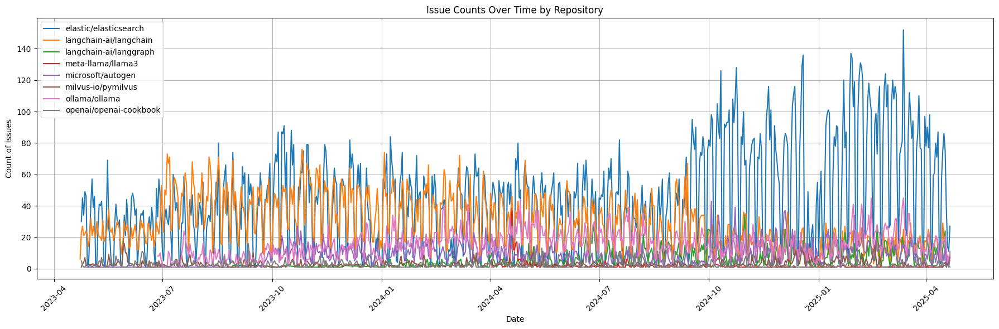

In [ ]:
#Add your code for requirement 2 in this cell

import pandas as pd
from datetime import datetime, timedelta
import pytz

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days = 365* 2)).astimezone(pytz.UTC)

req2 = pd.read_csv('dataset/issues_all_repo.csv')
req2 = req2.dropna(subset="created_at")

req2['created_at'] = pd.to_datetime(req2['created_at'], errors='coerce').dt.tz_convert('UTC')

req2['only_date'] = req2['created_at'].dt.date
req2 = req2[req2['created_at'] >= oldDate]

issues = req2.groupby(['repository', 'only_date']).size().reset_index(name="Count-of-Issues")
issues.tail(35)

issues['only_date'] = pd.to_datetime(issues['only_date'])

plt.figure(figsize=(18, 6))
 
for repo in issues["repository"].unique():
    repo_data = issues[issues["repository"] == repo]
    plt.plot(repo_data["only_date"], repo_data["Count-of-Issues"], label=repo)

# Adding labels and title
plt.title("Issue Counts Over Time by Repository")
plt.xlabel("Date")
plt.ylabel("Count of Issues")
plt.xticks(rotation=45)
plt.legend(title="Repository Name")
plt.grid(True)
plt.tight_layout()
 
plt.show()

 

<hr style="border:1px solid black"> </hr>

<div class="alert alert-info">   
    
## REQUIREMENT 3
- A bar chart to plot the issues created for every month for every repository
    
</div>

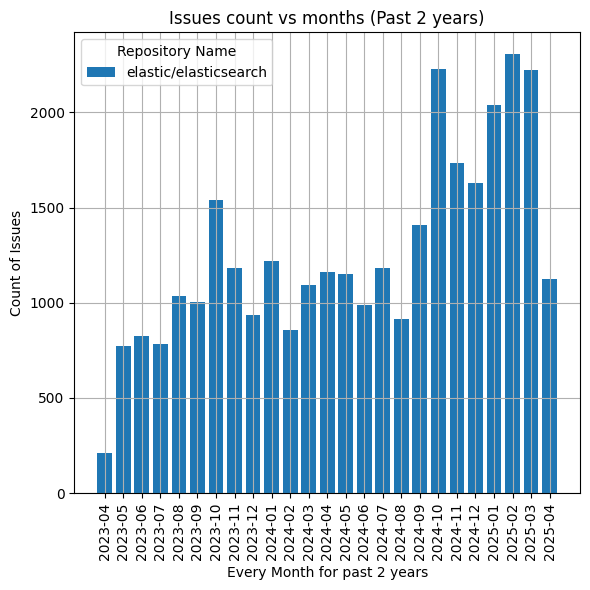

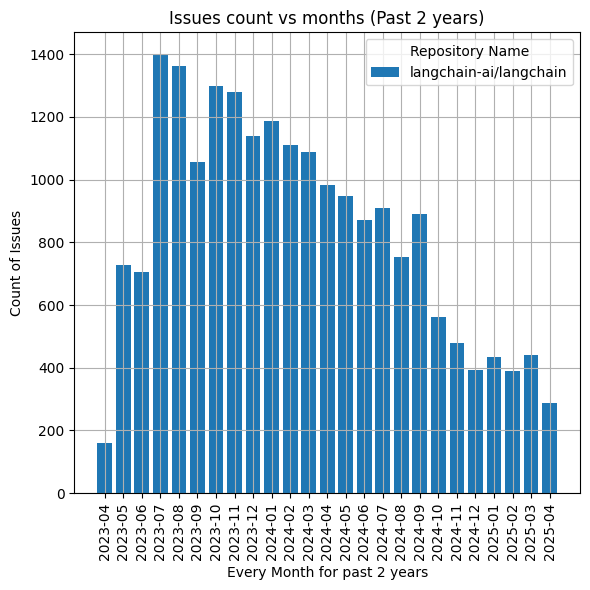

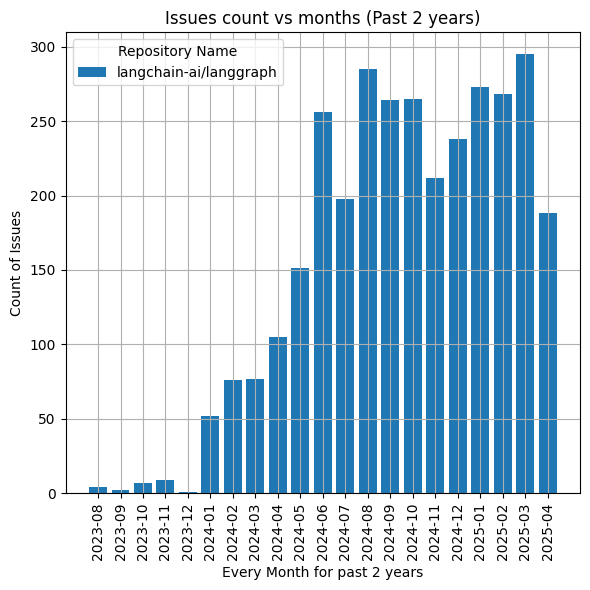

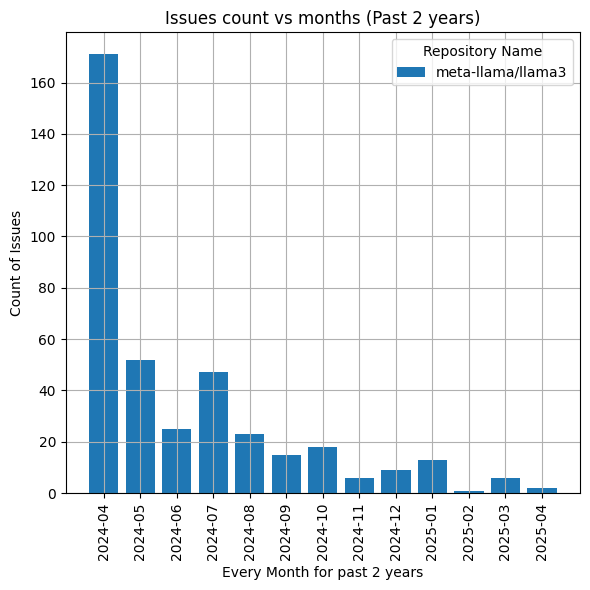

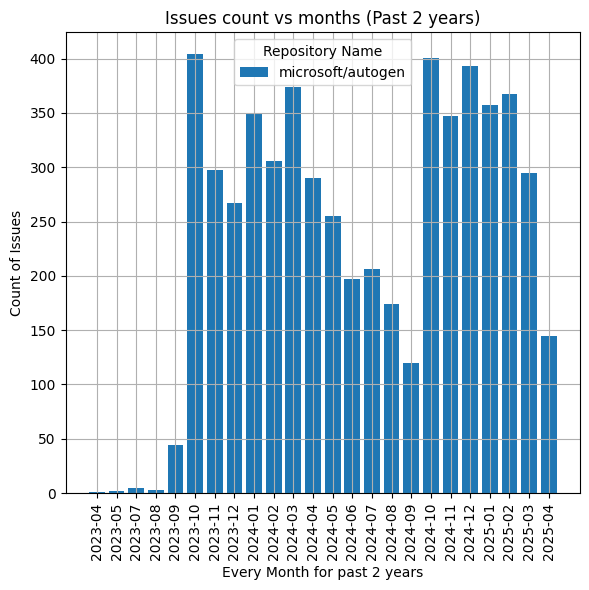

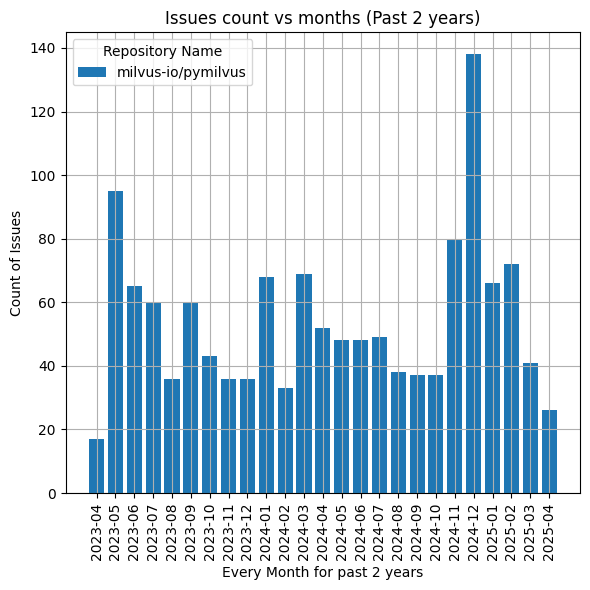

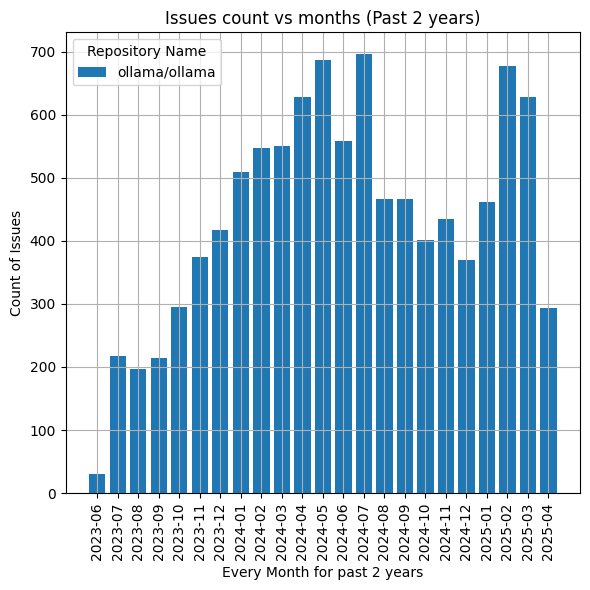

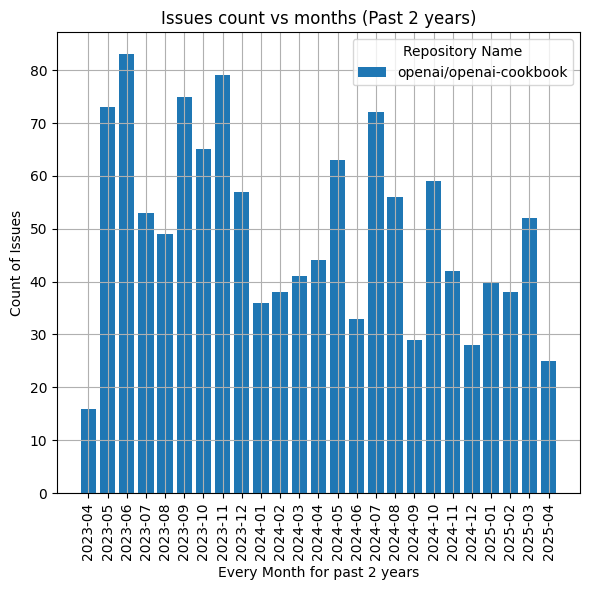

In [51]:
#Add your code for requirement 3 in this cell

from datetime import datetime, timedelta
import pytz

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days = 365 * 2)).astimezone(pytz.UTC)

req3 = pd.read_csv('dataset/issues_all_repo.csv')
req3 = req3.dropna(subset="created_at")

req3['created_at'] = pd.to_datetime(req3['created_at'], errors='coerce').dt.tz_convert('UTC')

req3['only_date'] = req3['created_at'].dt.date
req3 = req3[req3['created_at'] >= oldDate]

req3['only_date'] = pd.to_datetime(req3['only_date'])

req3["month"] = req3["only_date"].dt.to_period("M")

issues = req3.groupby(['repository', 'month']).size().reset_index(name="Count-of-Issues")

issues.head(35)

issues["month"] = issues["month"].astype(str)
 
for repo in issues["repository"].unique():
    plt.figure(figsize=(6, 6))
    repo_data = issues[issues["repository"] == repo]
    plt.bar(repo_data["month"], repo_data["Count-of-Issues"], label=repo)

    plt.title("Issues count vs months (Past 2 years)")
    plt.xlabel("Every Month for past 2 years")
    plt.ylabel("Count of Issues")
    plt.xticks(rotation=90)
    plt.legend(title="Repository Name")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 4
- A bar chart to plot the starts for every repository
    
</div>

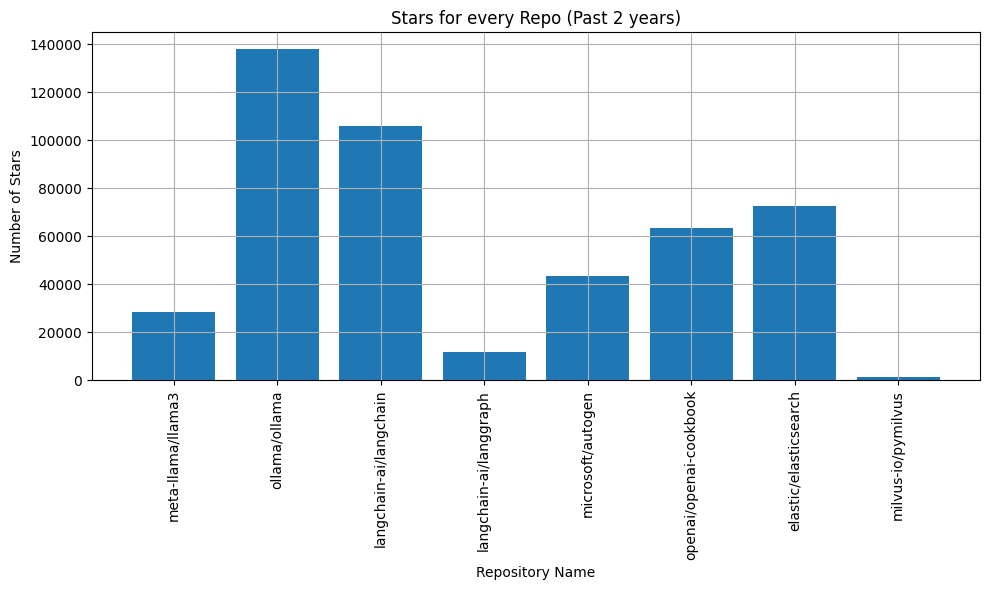

In [59]:
#Add your code for requirement 4 in this cell
req4 = pd.read_csv('dataset/all_repo_stars.csv')
req4.head()

plt.figure(figsize=(10,6))
plt.bar(req4["Repository"], req4["Stars"])
plt.title("Stars for every Repo (Past 2 years)")
plt.xlabel("Repository Name")
plt.ylabel("Number of Stars")
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 5
- A bar chart to plot the forks for every repository
    
</div>

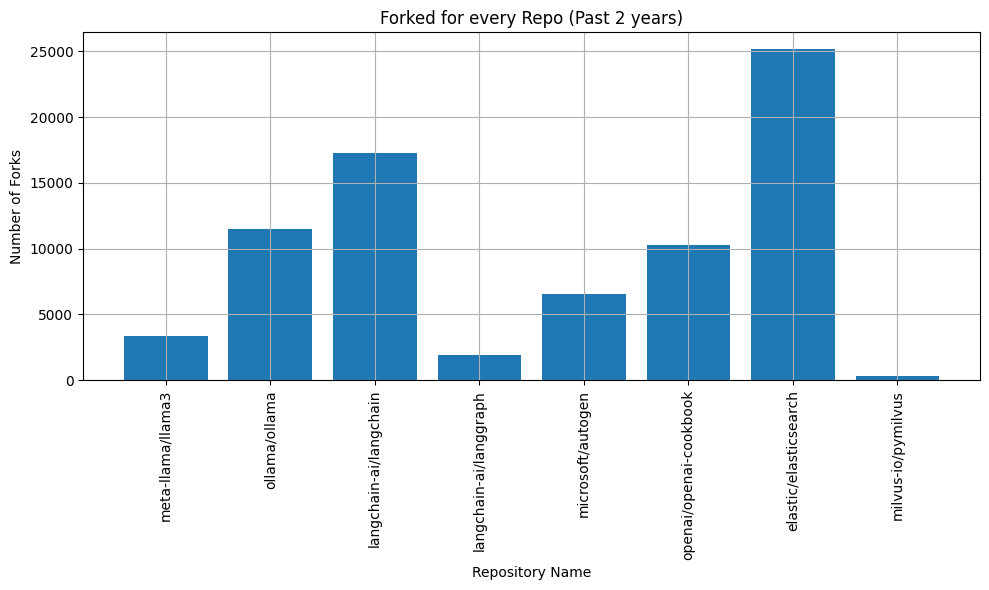

In [63]:
#Add your code for requirement 5 in this cell

req5 = pd.read_csv('dataset/all_repo_forkedIssues.csv')
req5.head()

plt.figure(figsize=(10,6))
plt.bar(req5["Repository"], req5["Forks"])
plt.title("Forked for every Repo (Past 2 years)")
plt.xlabel("Repository Name")
plt.ylabel("Number of Forks")
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 6
- A bar chart to plot the issues closed for every week for every repository
    
</div>

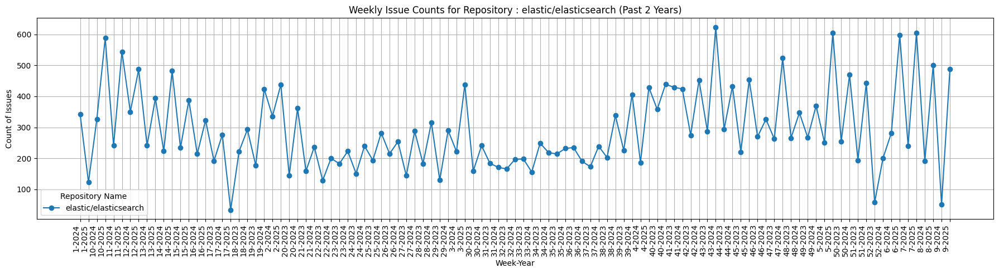

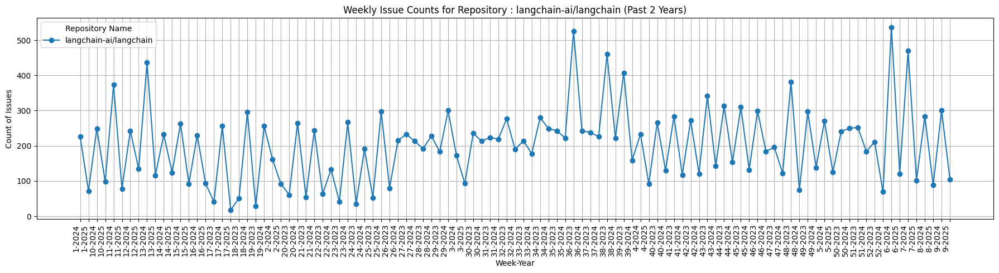

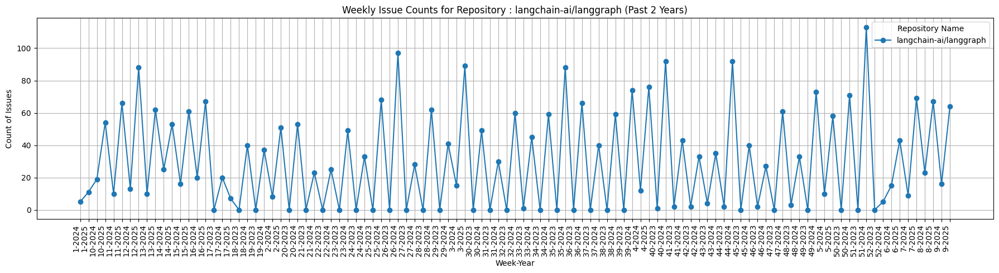

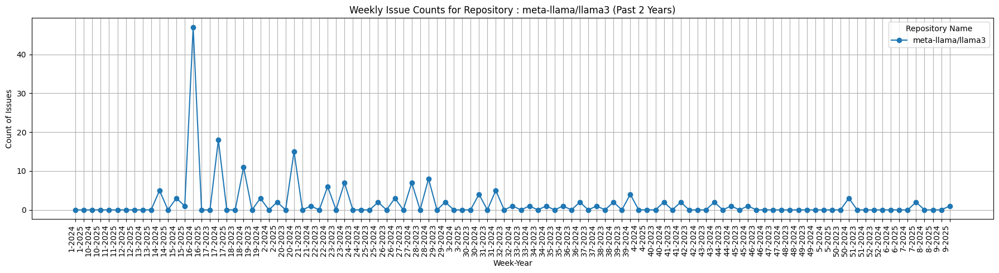

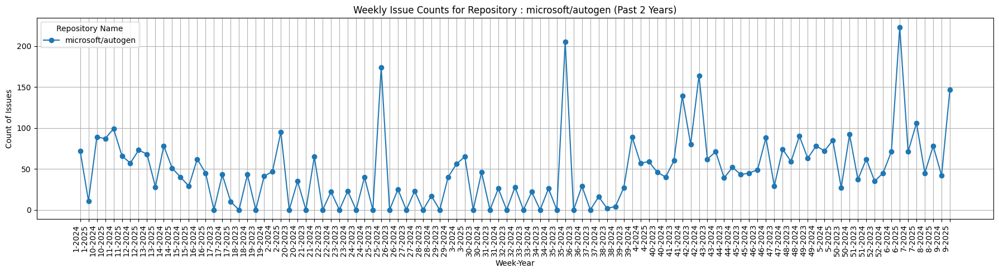

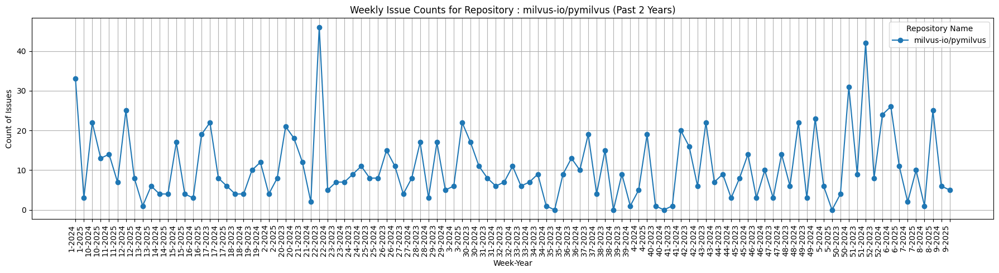

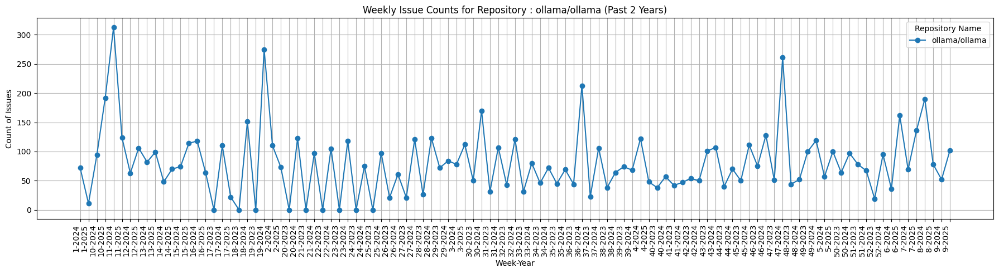

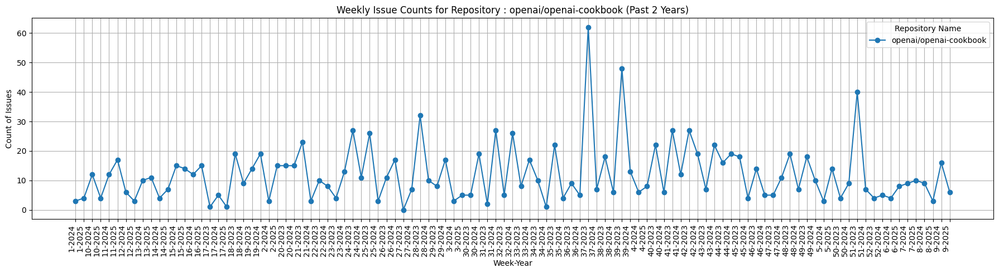

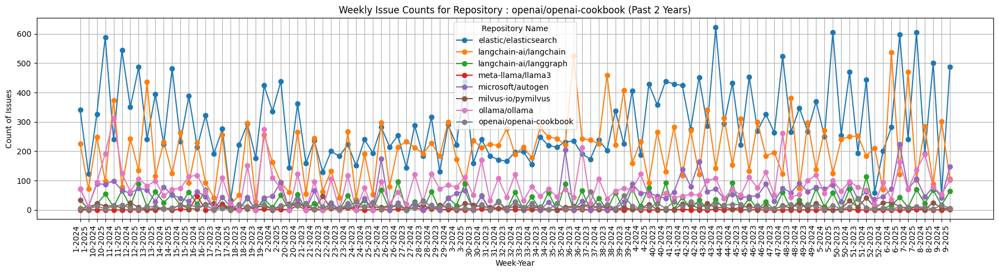

In [122]:
from datetime import datetime, timedelta
import pytz
import pandas as pd


nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).astimezone(pytz.UTC)

req6 = pd.read_csv('dataset/issues_all_repo.csv')

req6['closed_at'] = pd.to_datetime(req6['closed_at'], errors='coerce')

issues = req6.dropna(subset=['closed_at'])
issues = issues[issues['closed_at'] >= oldDate]

issues['week_based'] = issues['closed_at'].apply(lambda x: f"{x.isocalendar().week}-{x.year}")

weeklyInfo = issues.groupby(['repository', 'week_based']).size().reset_index(name='Count-of-Issues')

pivot_data = weeklyInfo.pivot(index='week_based', columns='repository', values='Count-of-Issues').fillna(0)


for repoName in pivot_data.columns:
    plt.figure(figsize=(18, 5))
    plt.plot(pivot_data.index, pivot_data[repoName], label=repoName, marker='o', linestyle='-')
    plt.title(f"Weekly Issue Counts for Repository : {repoName} (Past 2 Years)")
    plt.xlabel("Week-Year")
    plt.ylabel("Count of Issues")
    plt.xticks(rotation=90, ha='right')
    plt.legend(title="Repository Name")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

plt.figure(figsize=(18, 5))
for repoName in pivot_data.columns:
    plt.plot(pivot_data.index, pivot_data[repoName], label=repoName, marker='o', linestyle='-')
plt.title(f"Weekly Issue Counts for Repository : {repoName} (Past 2 Years)")
plt.xlabel("Week-Year")
plt.ylabel("Count of Issues")
plt.xticks(rotation=90, ha='right')
plt.legend(title="Repository Name")
plt.grid(True)
plt.tight_layout()
plt.show()

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 7
- A stack-bar Chart to plot the created and closed issues for every repository
    
</div>

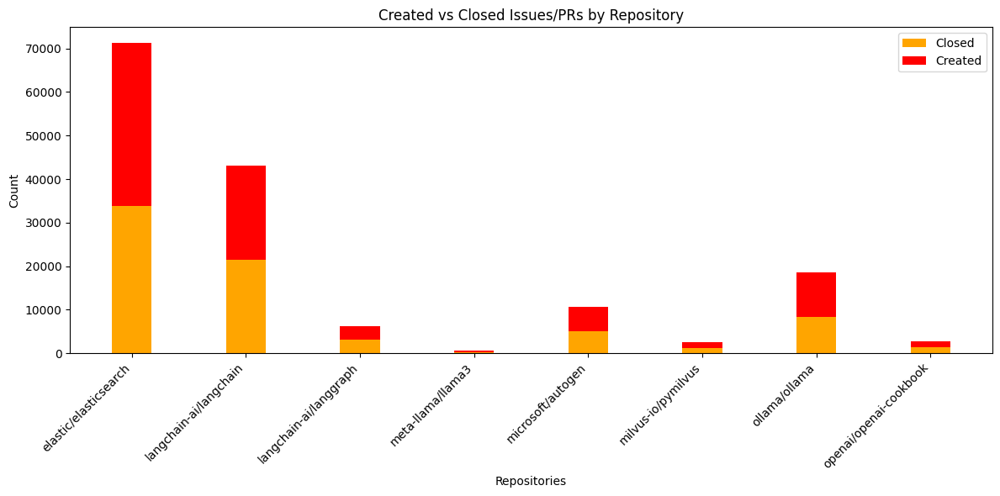

In [143]:
#Add your code for requirement 7 in this cell

from datetime import datetime, timedelta
import pytz
import pandas as pd

nowDate = datetime.now()
oldDate = (nowDate - timedelta(days=365 * 2)).astimezone(pytz.UTC)

req7 = pd.read_csv('dataset/issues_all_repo.csv')

req7['created_at'] = pd.to_datetime(req7['created_at'], errors='coerce')
req7['closed_at'] = pd.to_datetime(req7['closed_at'], errors='coerce')

issues = req7[(req7['created_at'] >= oldDate) | (req7['closed_at'] >= oldDate)]

createdColumnSum = req7.groupby('repository')['created_at'].count()
closedColumnSum =  req7.dropna(subset = ['closed_at']).groupby('repository')['closed_at'].count()

repositories = [
    'elastic/elasticsearch',
    'langchain-ai/langchain',
    'langchain-ai/langgraph',
    'meta-llama/llama3',
    'microsoft/autogen',
    'milvus-io/pymilvus',
    'ollama/ollama',
    'openai/openai-cookbook'
]
createdByList =[]
for i in createdColumnSum:
    createdByList.append(i)

closedByList =[]
for i in closedColumnSum:
    closedByList.append(i)

fig, ax = plt.subplots(figsize=(12, 6))
bar_width = 0.35
x = np.arange(len(repositories))

bars1 = ax.bar(x, closedByList, bar_width, label='Closed', color='orange')
bars2 = ax.bar(x, createdByList, bar_width, bottom=closedByList, label='Created', color='red')
ax.set_xlabel('Repositories')
ax.set_ylabel('Count')
ax.set_title('Created vs Closed Issues/PRs by Repository')
ax.set_xticks(x)
ax.set_xticklabels(repositories, rotation=45, ha='right')
ax.legend()
plt.tight_layout()
plt.show()


<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
REQUIREMENT 8 - LSTM in GitHub_Repos_Issues_Forecasting-LSTM.ipynb file
</div>

<hr style="border:1px solid black"> </hr>
<div class="alert alert-info">   
    
## REQUIREMENT 9 (FACEBOOK/PROPHET)
- Use Facebook/Prophet package to forecast the following for every repository
    
</div>

In [2]:
%pip install prophet

  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
  Using cached importlib_resources-6.5.2-py3-none-any.whl.metadata (3.9 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 18.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.9/917.9 kB 24.3 MB/s eta 0:00:00
Using cached tqdm-4.67.1-py3-none-any.whl (78 kB)
Using cached importlib_resources-6.5.2-py3-none-any.whl (37 kB)

[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python3.10 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


<div class="alert alert-block alert-warning">   
    
#### REQ9-1). The day of the week maximum number of issues created
    
</div>

21:42:27 - cmdstanpy - INFO - Chain [1] start processing
21:42:27 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues created for meta-llama/llama3 is: Thursday


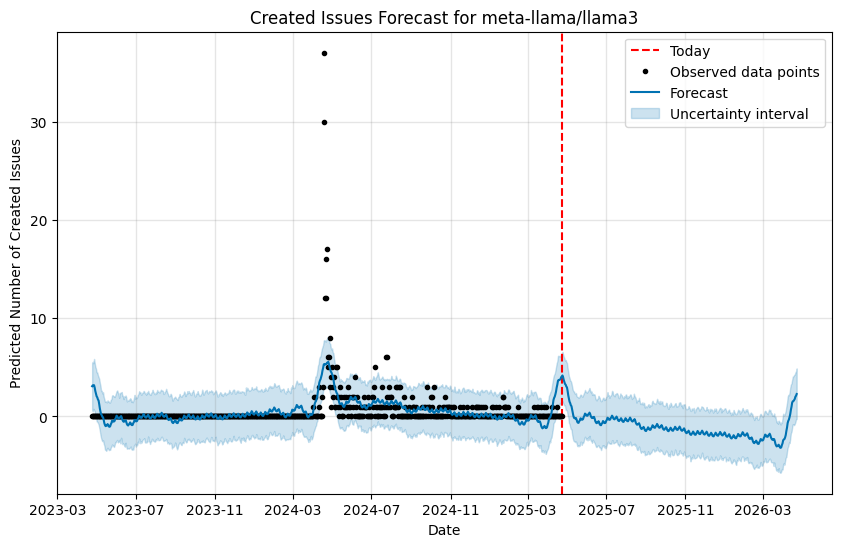

21:42:27 - cmdstanpy - INFO - Chain [1] start processing
21:42:27 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues created for ollama/ollama is: Thursday


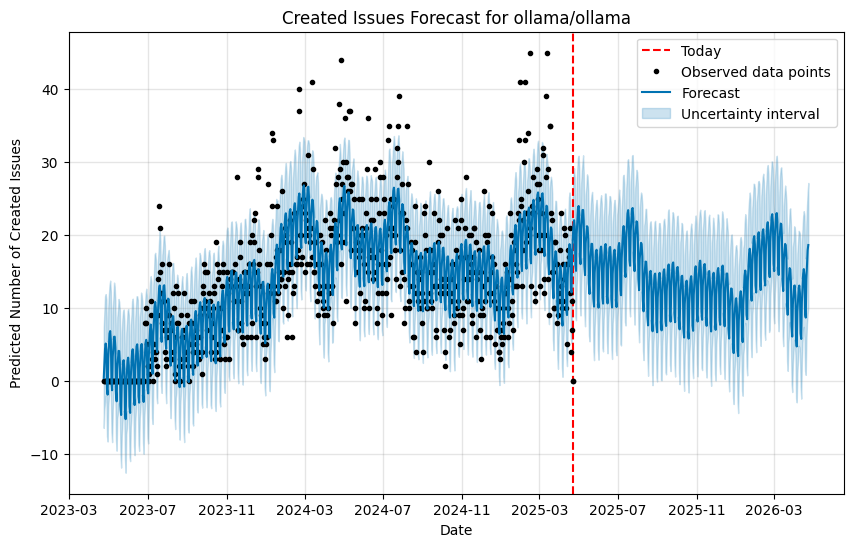

21:42:28 - cmdstanpy - INFO - Chain [1] start processing
21:42:28 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues created for langchain-ai/langchain is: Wednesday


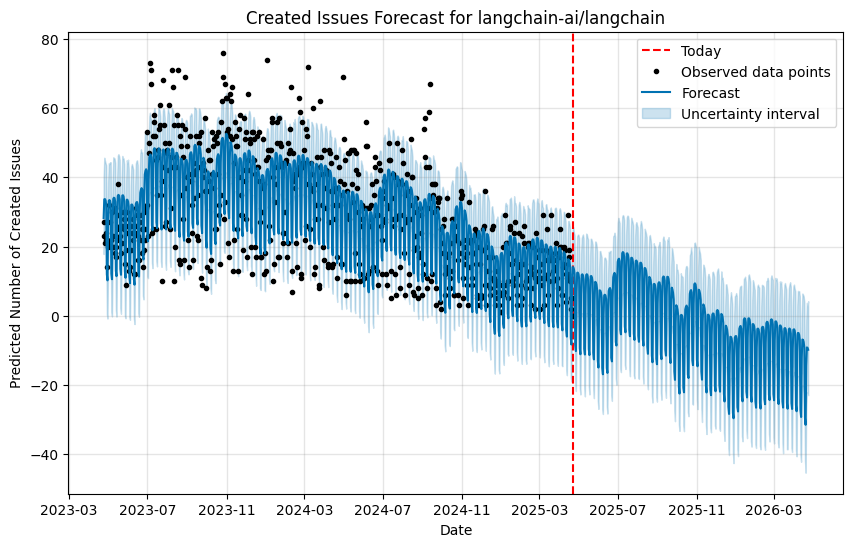

21:42:28 - cmdstanpy - INFO - Chain [1] start processing
21:42:28 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues created for langchain-ai/langgraph is: Wednesday


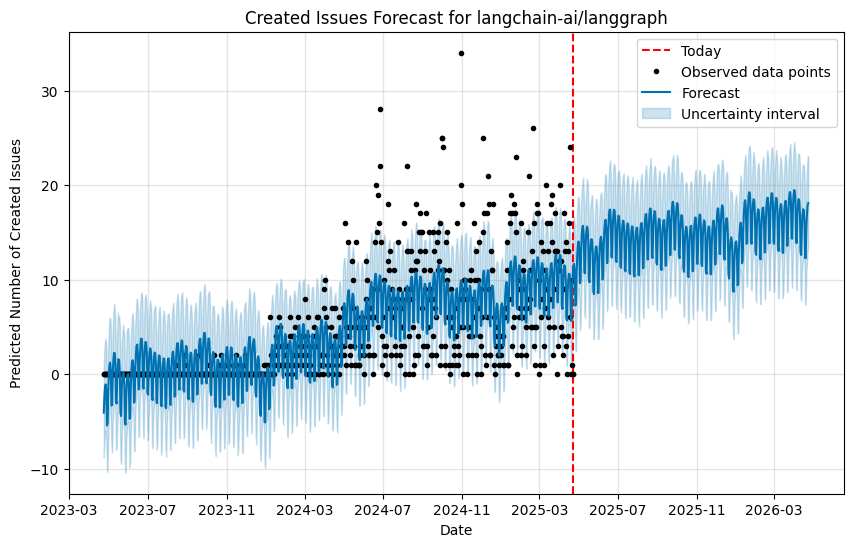

21:42:29 - cmdstanpy - INFO - Chain [1] start processing
21:42:29 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues created for microsoft/autogen is: Thursday


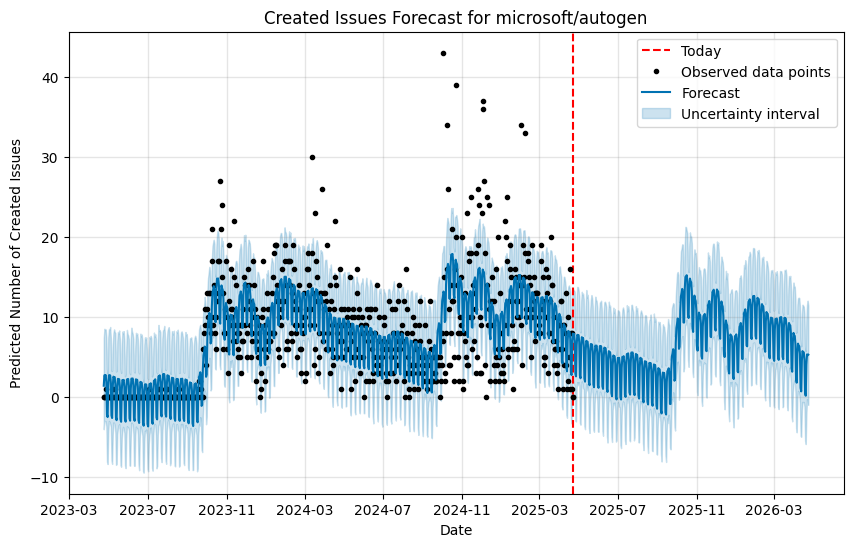

21:42:29 - cmdstanpy - INFO - Chain [1] start processing
21:42:29 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues created for openai/openai-cookbook is: Wednesday


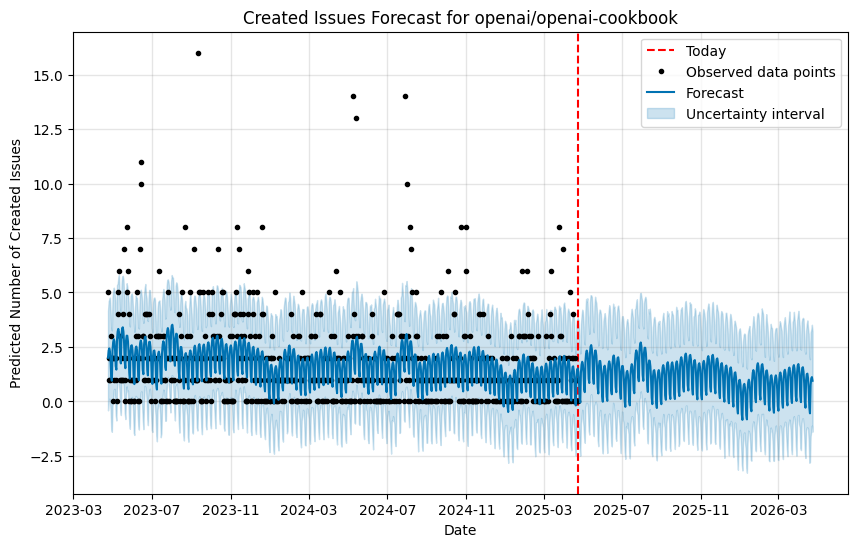

21:42:30 - cmdstanpy - INFO - Chain [1] start processing
21:42:30 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues created for elastic/elasticsearch is: Tuesday


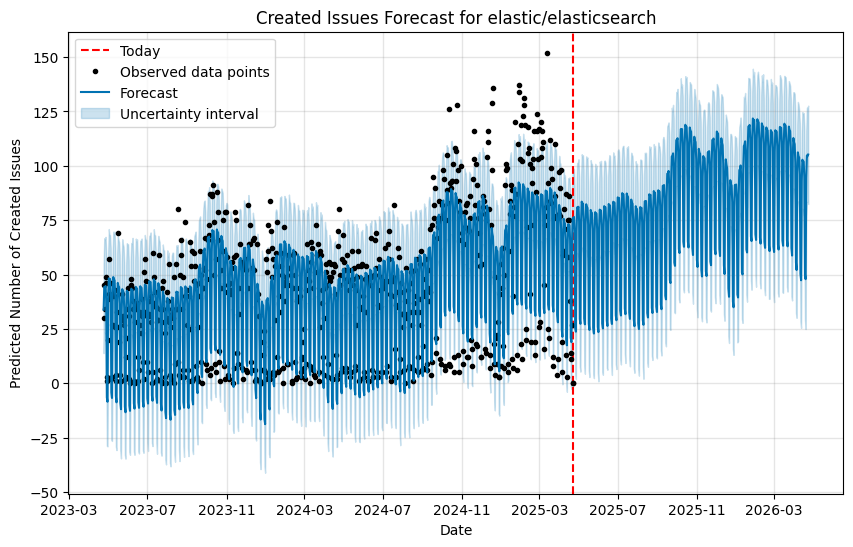

21:42:30 - cmdstanpy - INFO - Chain [1] start processing
21:42:30 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues created for milvus-io/pymilvus is: Wednesday


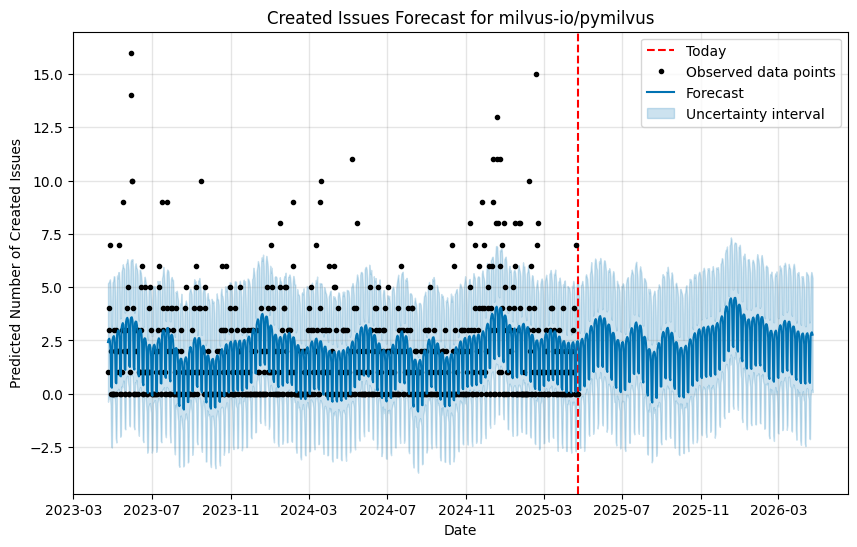

In [4]:
#Add your code for requirement 9.1 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    
    repoBasedDf['created_at'] = pd.to_datetime(repoBasedDf['created_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['created_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['created_at'] >= oldDate) & (repoBasedDf['created_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('created_at').size().reset_index(name='count')

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['created_at']
    newRepoData['y'] = repoBasedDfBasedOnDate['count']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    oneYearForcast['day_of_week'] = oneYearForcast['ds'].dt.day_name()
    max_day = oneYearForcast.groupby('day_of_week')['yhat'].sum().idxmax()
    
    print(f"The day of the week with the maximum forecasted number of issues created for {i} is: {max_day}")

    fig, ax = plt.subplots(figsize=(10, 6))
    
    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    model.plot(oneYearForcast, ax=ax)
    plt.title(f"Created Issues Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Created Issues")
    plt.grid(True)
    plt.legend()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-2). The day of the week maximum number of issues closed

</div>

21:43:17 - cmdstanpy - INFO - Chain [1] start processing
21:43:17 - cmdstanpy - INFO - Chain [1] done processing


          ds  y
0 2023-04-24  0
1 2023-04-25  0
2 2023-04-26  0
3 2023-04-27  0
4 2023-04-28  0
The day of the week with the maximum forecasted number of issues Closed for meta-llama/llama3 is: Wednesday


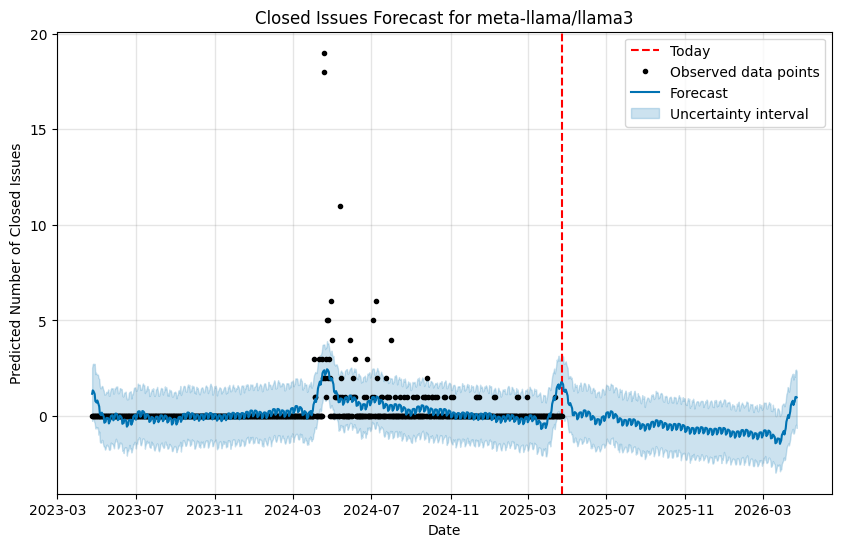

21:43:18 - cmdstanpy - INFO - Chain [1] start processing


          ds  y
0 2023-04-24  0
1 2023-04-25  0
2 2023-04-26  0
3 2023-04-27  0
4 2023-04-28  0


21:43:18 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues Closed for ollama/ollama is: Tuesday


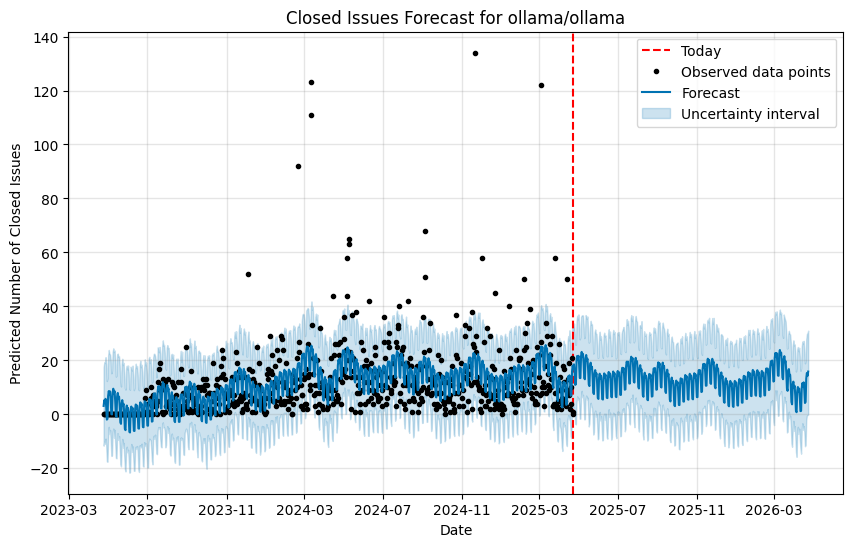

          ds  y
0 2023-04-24  7
1 2023-04-25  9
2 2023-04-26  3
3 2023-04-27  8
4 2023-04-28  5


21:43:18 - cmdstanpy - INFO - Chain [1] start processing
21:43:18 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues Closed for langchain-ai/langchain is: Tuesday


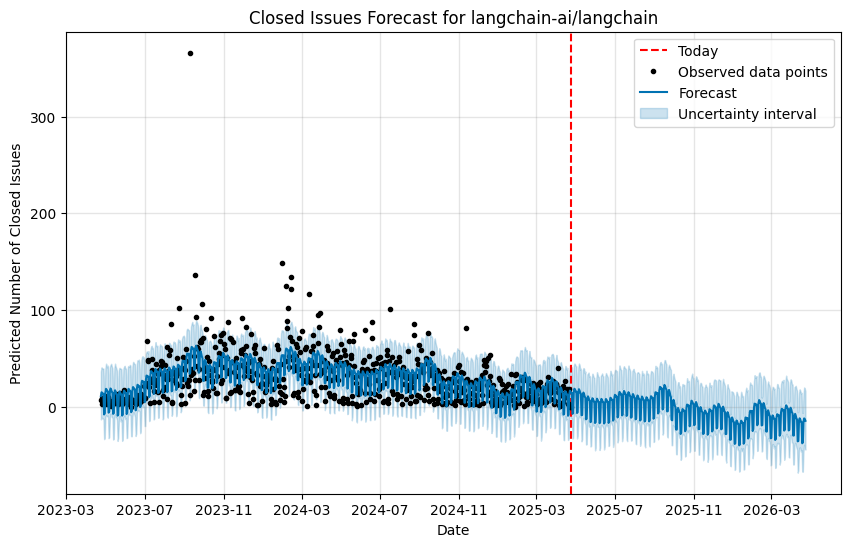

21:43:19 - cmdstanpy - INFO - Chain [1] start processing


          ds  y
0 2023-04-24  0
1 2023-04-25  0
2 2023-04-26  0
3 2023-04-27  0
4 2023-04-28  0


21:43:19 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues Closed for langchain-ai/langgraph is: Wednesday


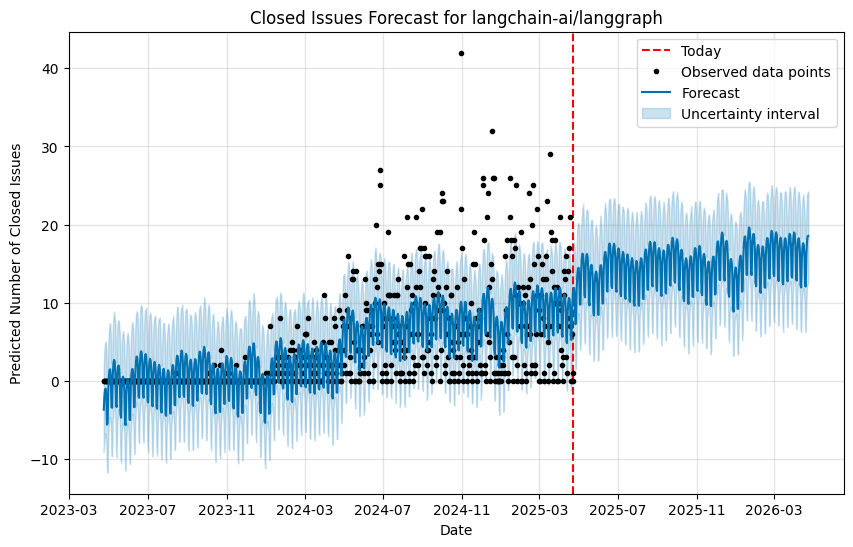

21:43:19 - cmdstanpy - INFO - Chain [1] start processing


          ds  y
0 2023-04-24  0
1 2023-04-25  0
2 2023-04-26  0
3 2023-04-27  0
4 2023-04-28  0


21:43:19 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues Closed for microsoft/autogen is: Tuesday


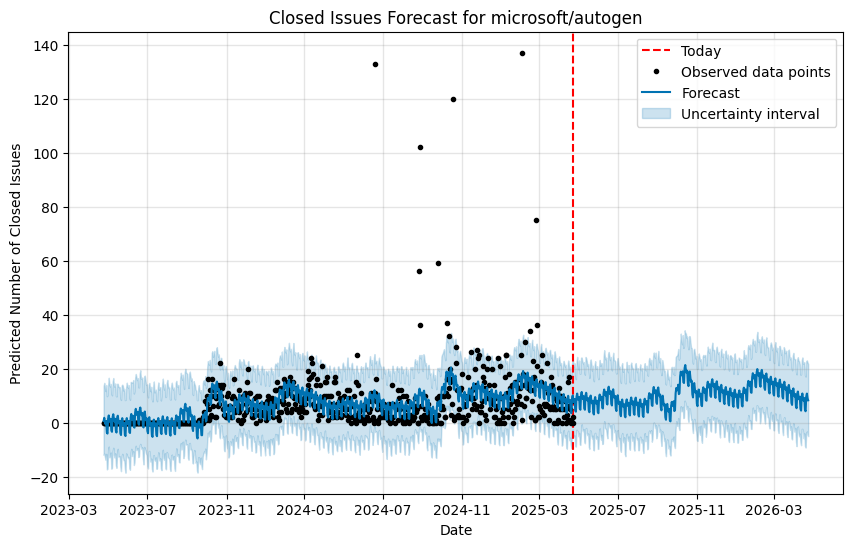

21:43:19 - cmdstanpy - INFO - Chain [1] start processing
21:43:19 - cmdstanpy - INFO - Chain [1] done processing


          ds  y
0 2023-04-24  0
1 2023-04-25  1
2 2023-04-26  0
3 2023-04-27  0
4 2023-04-28  0
The day of the week with the maximum forecasted number of issues Closed for openai/openai-cookbook is: Tuesday


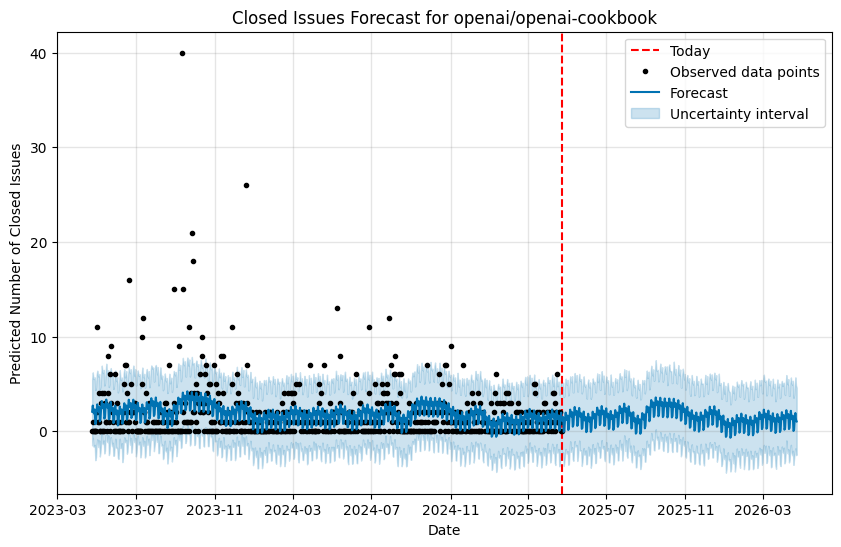

21:43:20 - cmdstanpy - INFO - Chain [1] start processing


          ds   y
0 2023-04-24  27
1 2023-04-25  38
2 2023-04-26  38
3 2023-04-27  55
4 2023-04-28  31


21:43:20 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues Closed for elastic/elasticsearch is: Wednesday


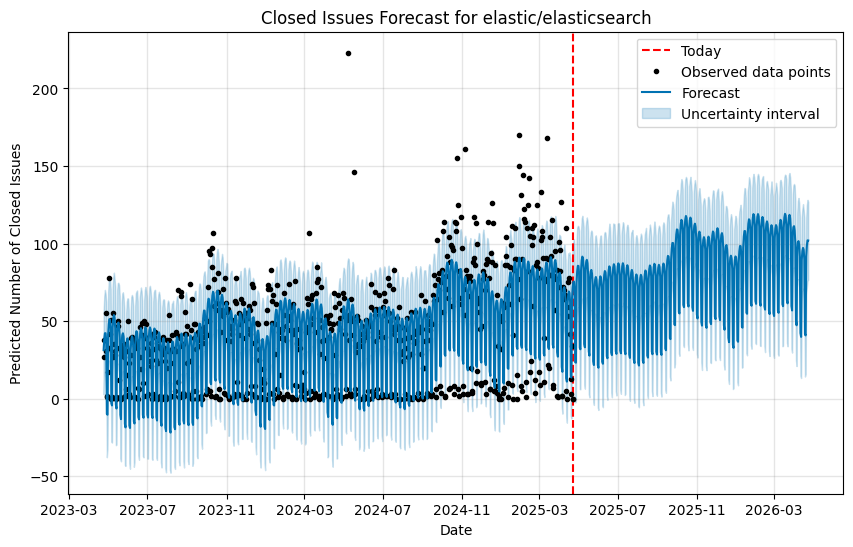

21:43:20 - cmdstanpy - INFO - Chain [1] start processing


          ds  y
0 2023-04-24  0
1 2023-04-25  3
2 2023-04-26  5
3 2023-04-27  9
4 2023-04-28  4


21:43:20 - cmdstanpy - INFO - Chain [1] done processing


The day of the week with the maximum forecasted number of issues Closed for milvus-io/pymilvus is: Monday


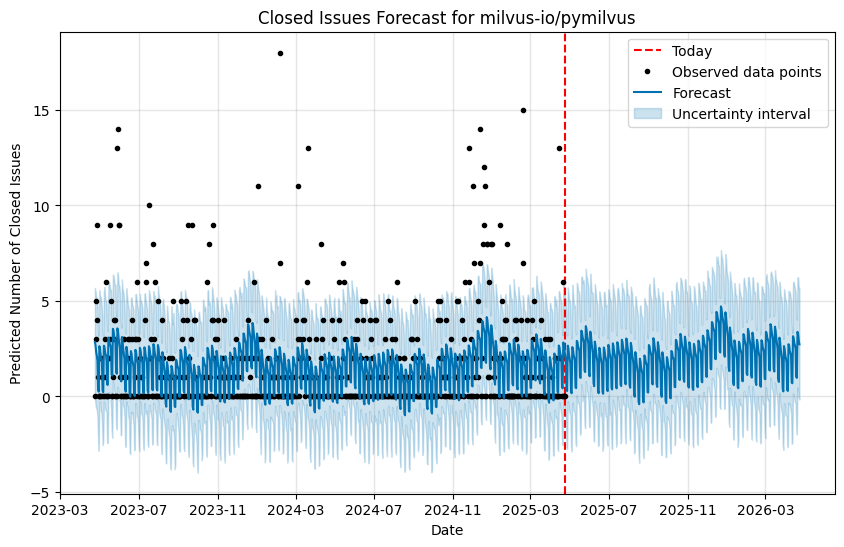

In [ ]:
#Add your code for requirement 9.2 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    
    repoBasedDf['closed_at'] = pd.to_datetime(repoBasedDf['closed_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['closed_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['closed_at'] >= oldDate) & (repoBasedDf['closed_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('closed_at').size().reset_index(name='count')

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['closed_at']
    newRepoData['y'] = repoBasedDfBasedOnDate['count']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    oneYearForcast['day_of_week'] = oneYearForcast['ds'].dt.day_name()
    max_day = oneYearForcast.groupby('day_of_week')['yhat'].sum().idxmax()
    
    print(f"The day of the week with the maximum forecasted number of issues Closed for {i} is: {max_day}")

    fig, ax = plt.subplots(figsize=(10, 6))

    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    model.plot(oneYearForcast, ax=ax)
    plt.title(f"Closed Issues Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Closed Issues")
    plt.grid(True)
    plt.legend()
    plt.show()

<div class="alert alert-block alert-warning">   
    
#### REQ9-3). The month of the year that has maximum number of issues closed


</div>

21:43:54 - cmdstanpy - INFO - Chain [1] start processing
21:43:54 - cmdstanpy - INFO - Chain [1] done processing


The month of the year with the maximum forecasted number of issues Closed for meta-llama/llama3 is: April


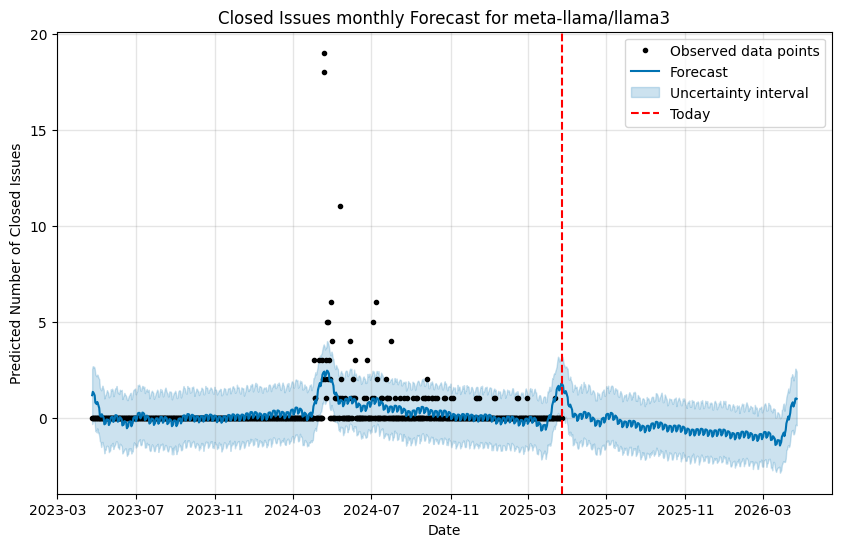

21:43:55 - cmdstanpy - INFO - Chain [1] start processing
21:43:55 - cmdstanpy - INFO - Chain [1] done processing


The month of the year with the maximum forecasted number of issues Closed for ollama/ollama is: March


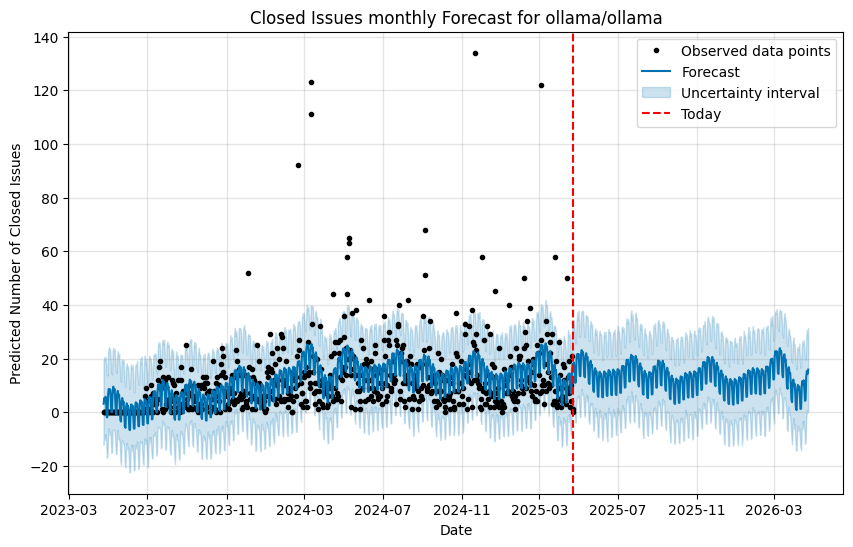

21:43:55 - cmdstanpy - INFO - Chain [1] start processing
21:43:55 - cmdstanpy - INFO - Chain [1] done processing


The month of the year with the maximum forecasted number of issues Closed for langchain-ai/langchain is: September


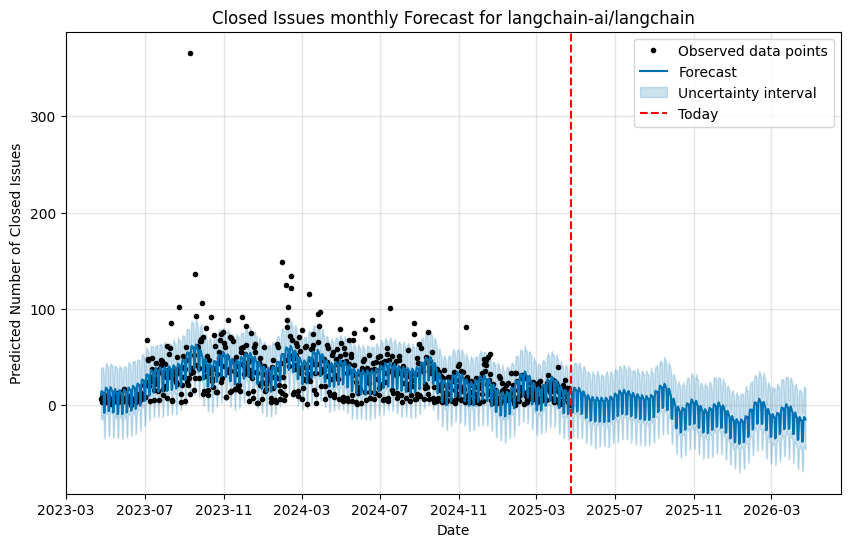

21:43:56 - cmdstanpy - INFO - Chain [1] start processing
21:43:56 - cmdstanpy - INFO - Chain [1] done processing


The month of the year with the maximum forecasted number of issues Closed for langchain-ai/langgraph is: March


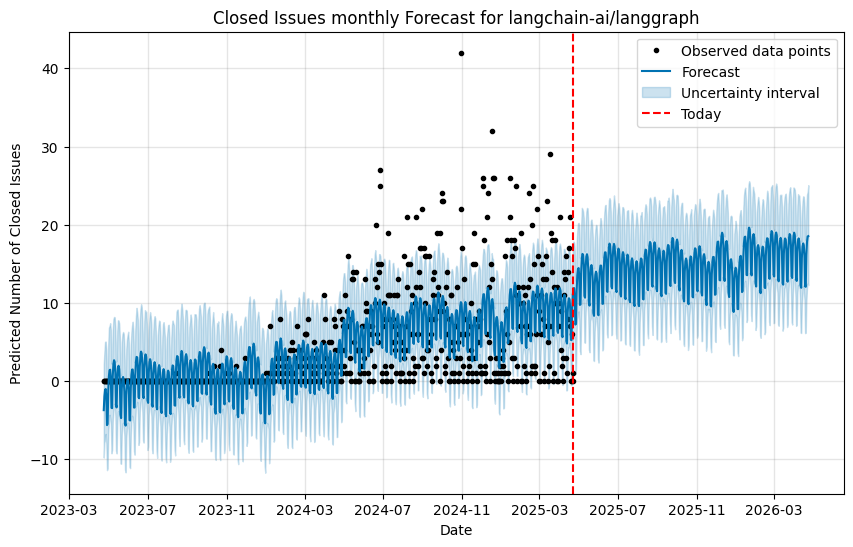

21:43:56 - cmdstanpy - INFO - Chain [1] start processing
21:43:56 - cmdstanpy - INFO - Chain [1] done processing


The month of the year with the maximum forecasted number of issues Closed for microsoft/autogen is: October


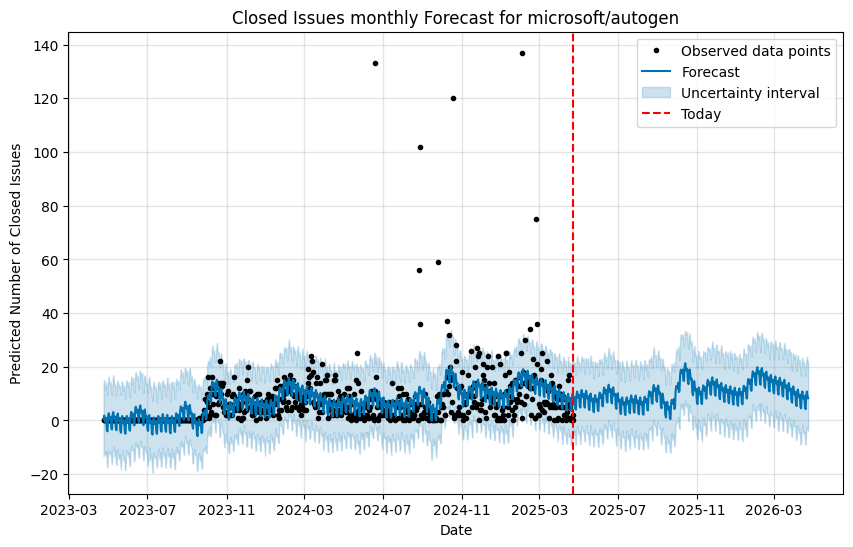

21:43:57 - cmdstanpy - INFO - Chain [1] start processing
21:43:57 - cmdstanpy - INFO - Chain [1] done processing


The month of the year with the maximum forecasted number of issues Closed for openai/openai-cookbook is: October


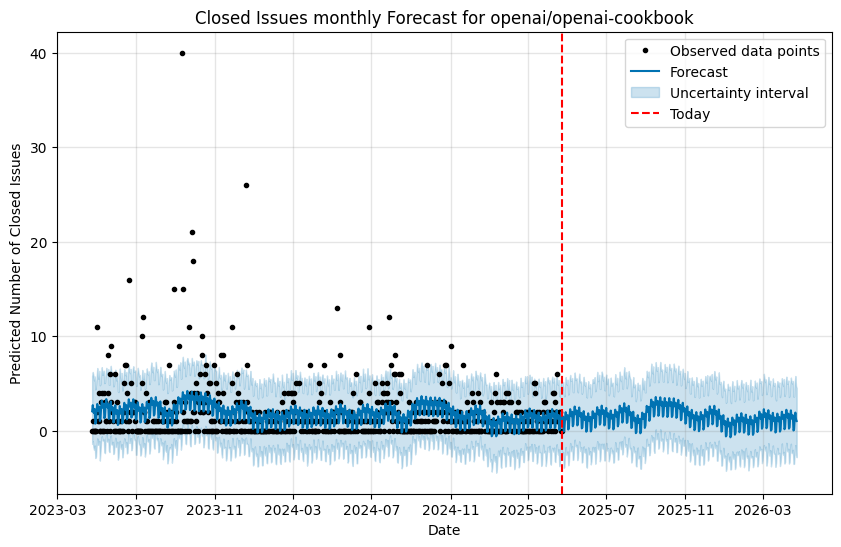

21:43:57 - cmdstanpy - INFO - Chain [1] start processing
21:43:57 - cmdstanpy - INFO - Chain [1] done processing


The month of the year with the maximum forecasted number of issues Closed for elastic/elasticsearch is: October


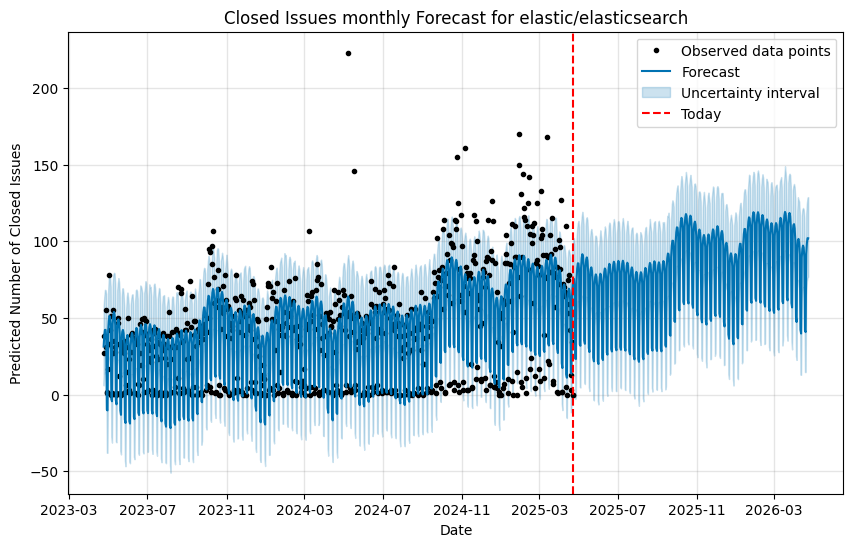

21:43:58 - cmdstanpy - INFO - Chain [1] start processing
21:43:58 - cmdstanpy - INFO - Chain [1] done processing


The month of the year with the maximum forecasted number of issues Closed for milvus-io/pymilvus is: December


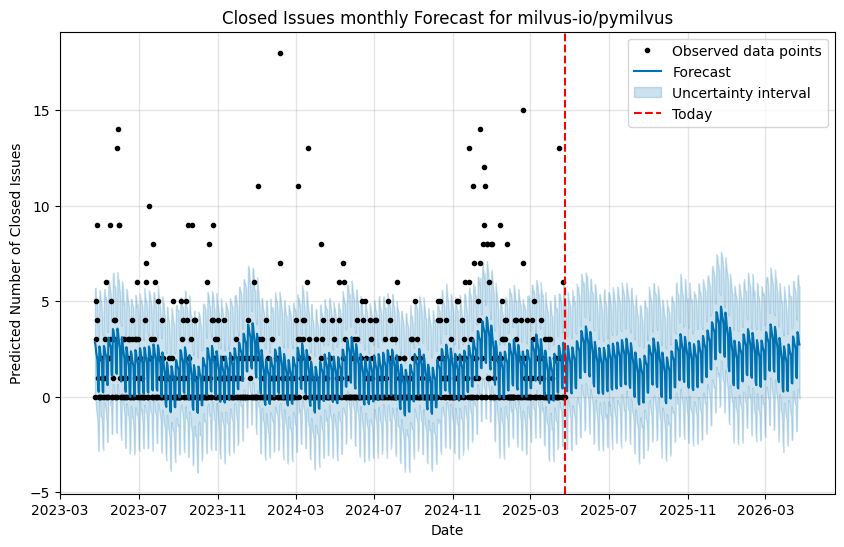

In [6]:
#Add your code for requirement 9.3 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    
    repoBasedDf['closed_at'] = pd.to_datetime(repoBasedDf['closed_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['closed_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['closed_at'] >= oldDate) & (repoBasedDf['closed_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('closed_at').size().reset_index(name='count')

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['closed_at']
    newRepoData['y'] = repoBasedDfBasedOnDate['count']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    oneYearForcast['month_year'] = oneYearForcast['ds'].dt.month_name()
    highestMonth = oneYearForcast.groupby('month_year')['yhat'].sum().idxmax()
    
    print(f"The month of the year with the maximum forecasted number of issues Closed for {i} is: {highestMonth}")

    fig, ax = plt.subplots(figsize=(10, 6))
    model.plot(oneYearForcast, ax=ax)

    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    plt.title(f"Closed Issues monthly Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Closed Issues")
    plt.grid(True)
    plt.legend()
    plt.show()

<div class="alert alert-block alert-warning">   
    
#### REQ9-4). Plot the created issues forecast

</div>

21:44:30 - cmdstanpy - INFO - Chain [1] start processing
21:44:30 - cmdstanpy - INFO - Chain [1] done processing


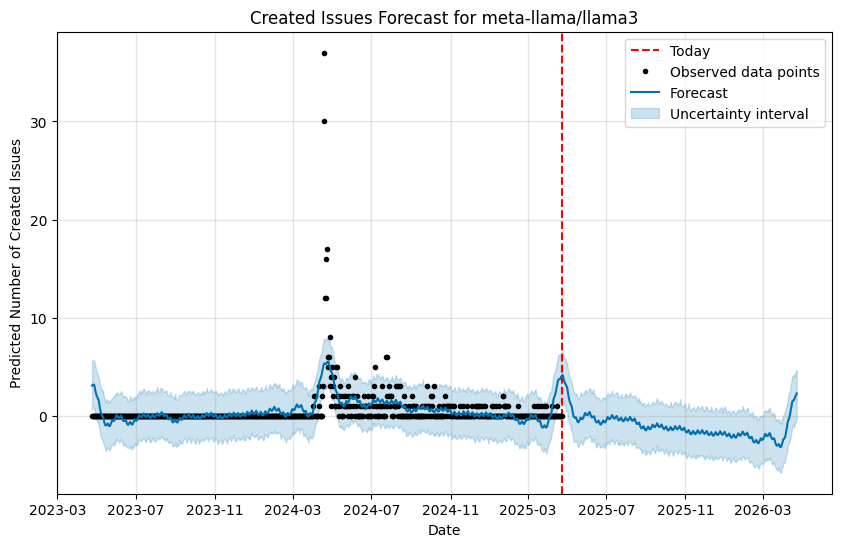

21:44:31 - cmdstanpy - INFO - Chain [1] start processing
21:44:31 - cmdstanpy - INFO - Chain [1] done processing


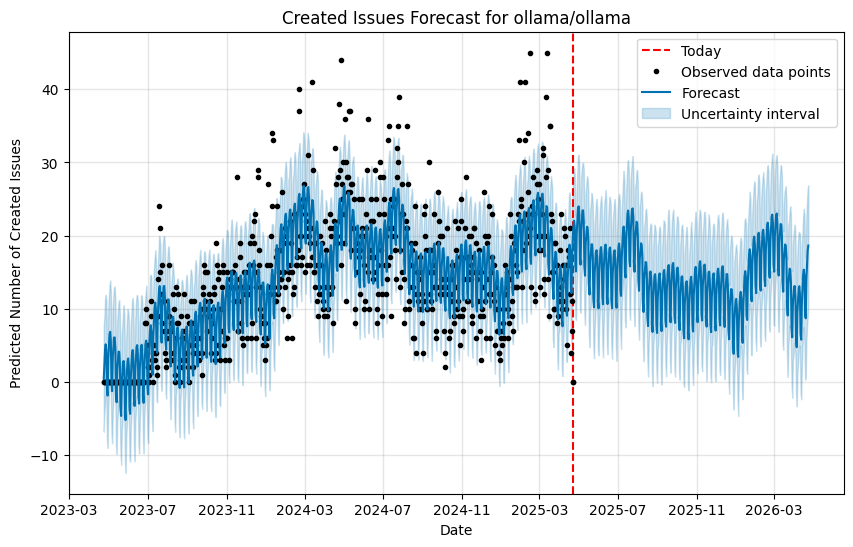

21:44:31 - cmdstanpy - INFO - Chain [1] start processing
21:44:31 - cmdstanpy - INFO - Chain [1] done processing


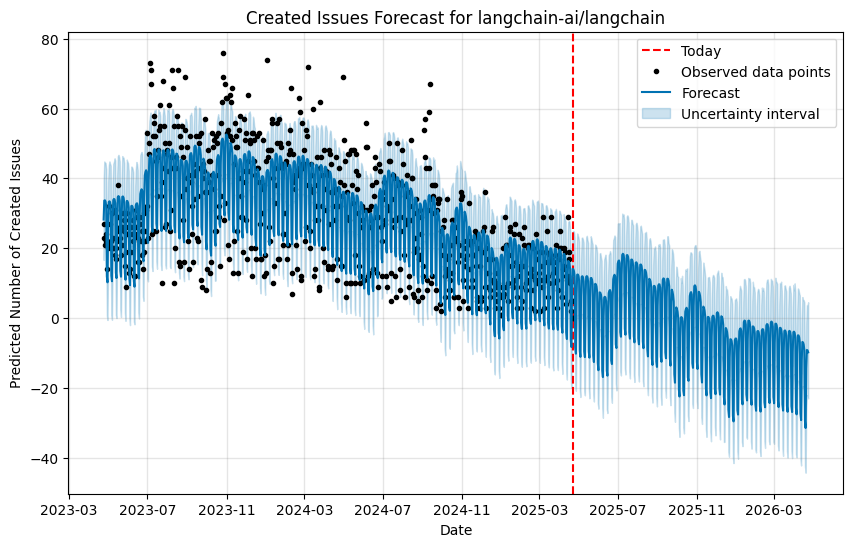

21:44:32 - cmdstanpy - INFO - Chain [1] start processing
21:44:32 - cmdstanpy - INFO - Chain [1] done processing


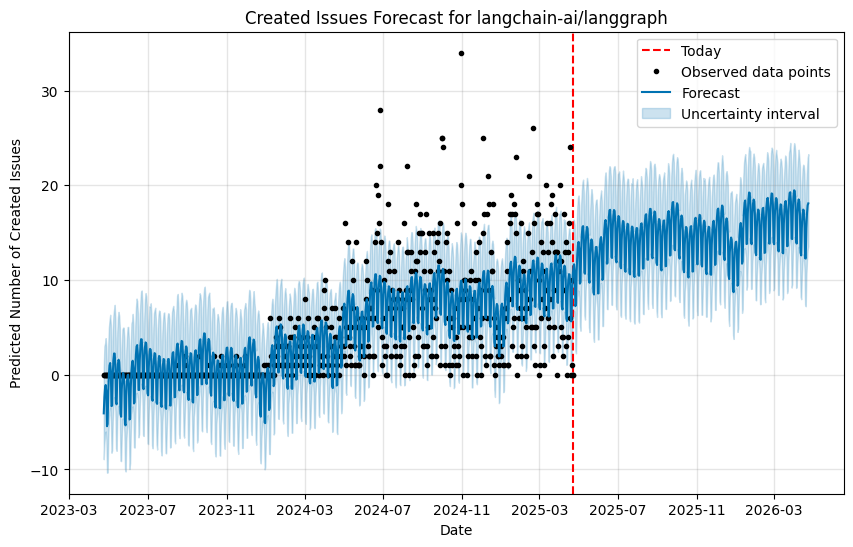

21:44:32 - cmdstanpy - INFO - Chain [1] start processing
21:44:32 - cmdstanpy - INFO - Chain [1] done processing


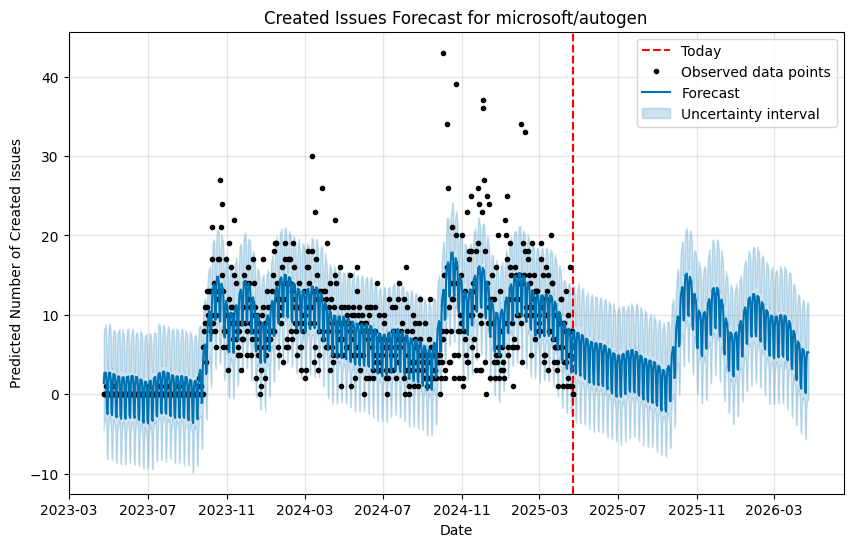

21:44:33 - cmdstanpy - INFO - Chain [1] start processing
21:44:33 - cmdstanpy - INFO - Chain [1] done processing


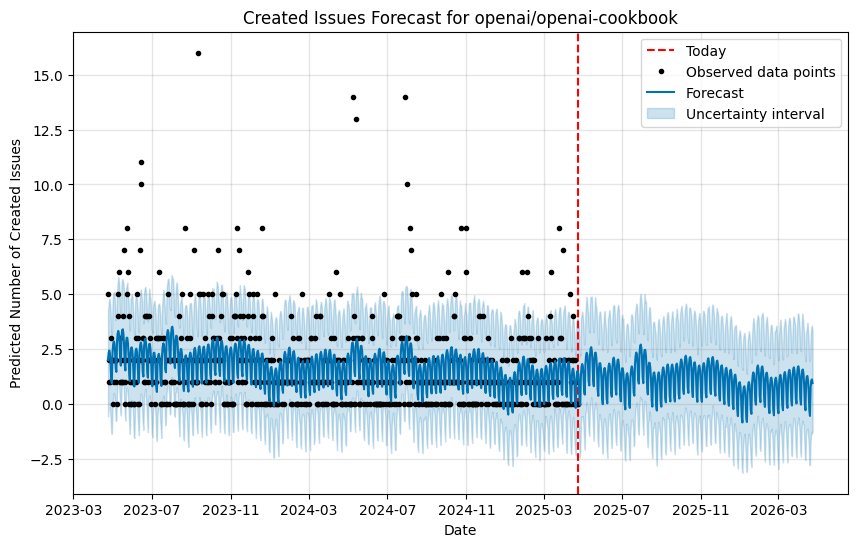

21:44:33 - cmdstanpy - INFO - Chain [1] start processing
21:44:33 - cmdstanpy - INFO - Chain [1] done processing


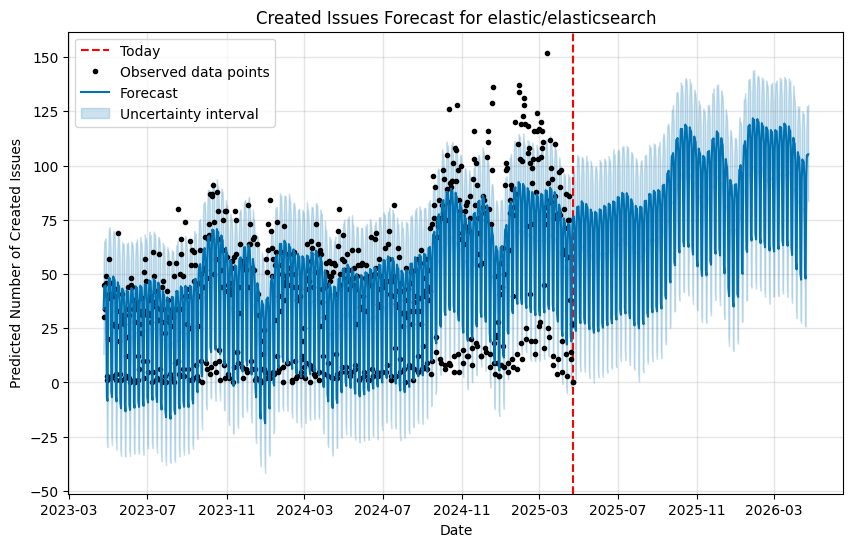

21:44:33 - cmdstanpy - INFO - Chain [1] start processing
21:44:33 - cmdstanpy - INFO - Chain [1] done processing


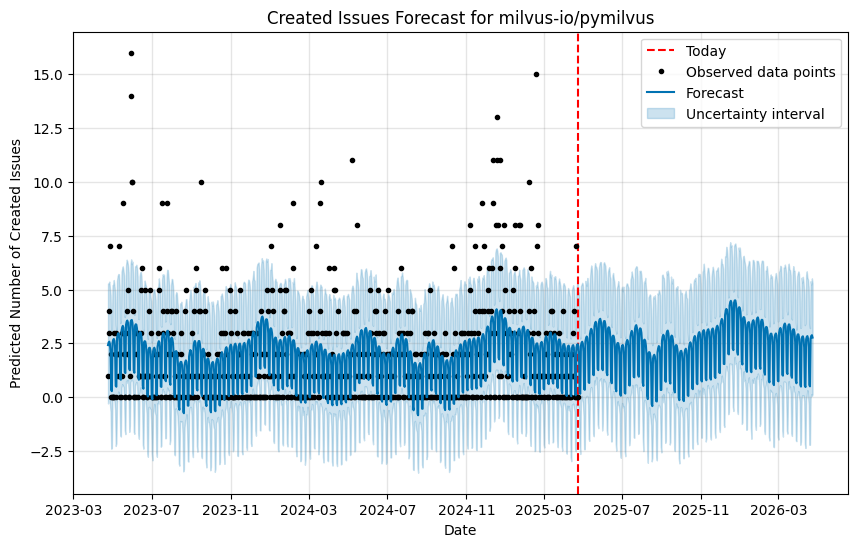

In [8]:
#Add your code for requirement 9.4 in this cell


import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    
    repoBasedDf['created_at'] = pd.to_datetime(repoBasedDf['created_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['created_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['created_at'] >= oldDate) & (repoBasedDf['created_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('created_at').size().reset_index(name='count')

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['created_at']
    newRepoData['y'] = repoBasedDfBasedOnDate['count']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    fig, ax = plt.subplots(figsize=(10, 6))
    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    model.plot(oneYearForcast, ax=ax)
    plt.title(f"Created Issues Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Created Issues")
    plt.grid(True)
    plt.legend()
    plt.show()

<div class="alert alert-block alert-warning">   
    
#### REQ9-5). Plot the closed issues forecast

</div>

21:44:44 - cmdstanpy - INFO - Chain [1] start processing
21:44:44 - cmdstanpy - INFO - Chain [1] done processing


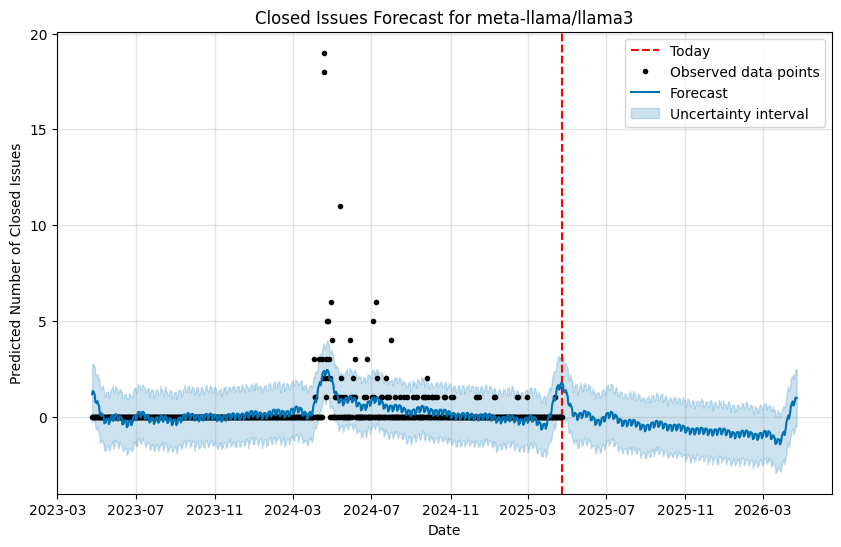

21:44:44 - cmdstanpy - INFO - Chain [1] start processing
21:44:44 - cmdstanpy - INFO - Chain [1] done processing


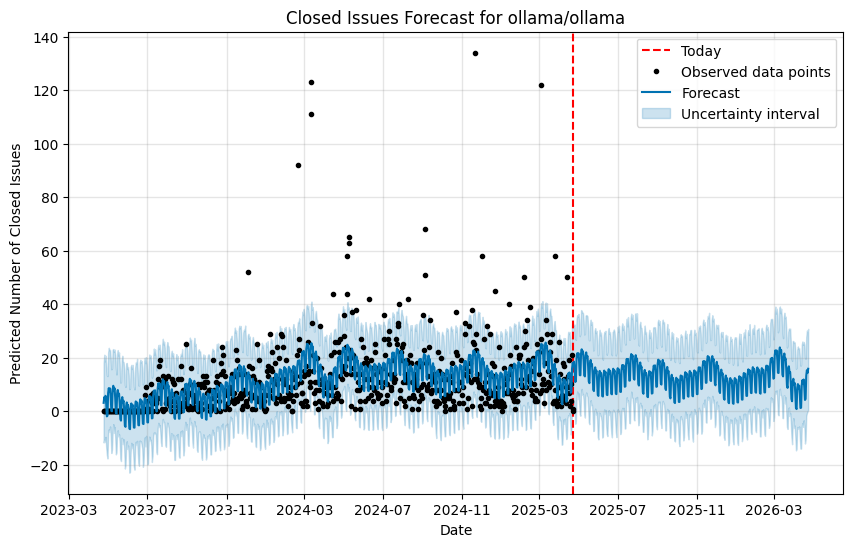

21:44:45 - cmdstanpy - INFO - Chain [1] start processing
21:44:45 - cmdstanpy - INFO - Chain [1] done processing


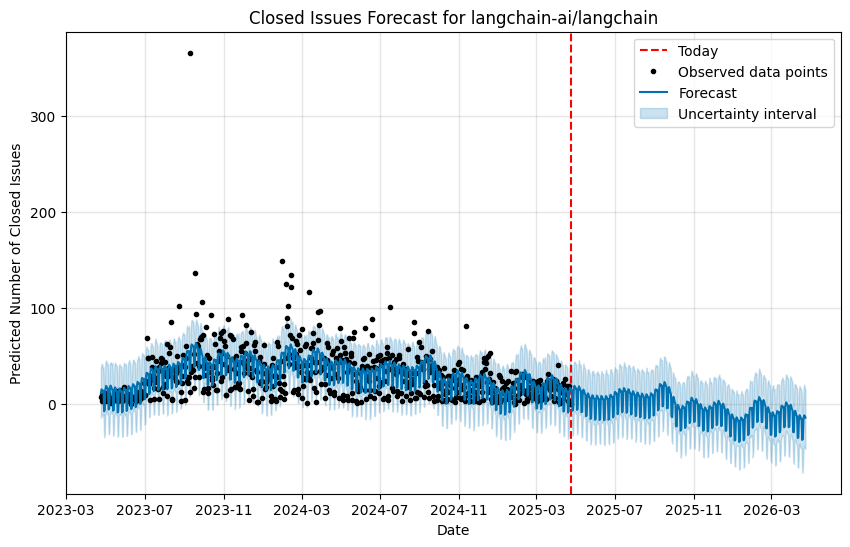

21:44:45 - cmdstanpy - INFO - Chain [1] start processing
21:44:45 - cmdstanpy - INFO - Chain [1] done processing


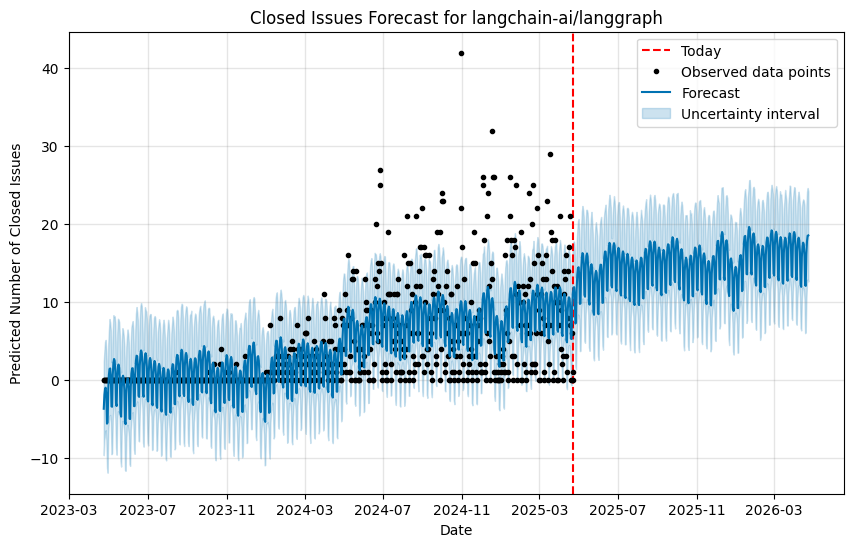

21:44:45 - cmdstanpy - INFO - Chain [1] start processing
21:44:45 - cmdstanpy - INFO - Chain [1] done processing


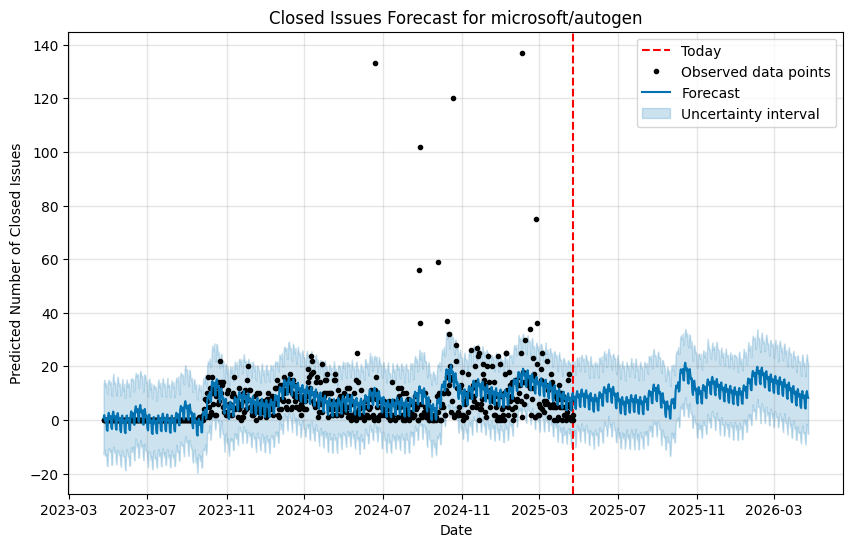

21:44:46 - cmdstanpy - INFO - Chain [1] start processing
21:44:46 - cmdstanpy - INFO - Chain [1] done processing


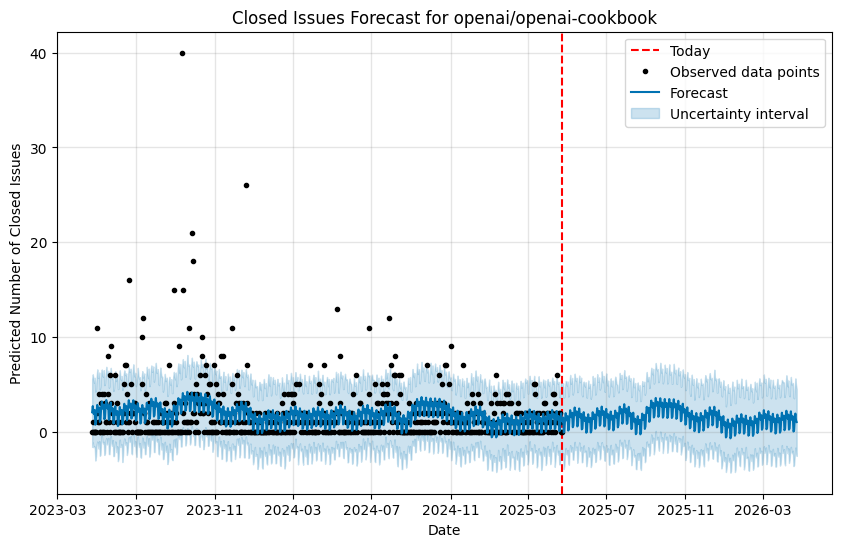

21:44:46 - cmdstanpy - INFO - Chain [1] start processing
21:44:46 - cmdstanpy - INFO - Chain [1] done processing


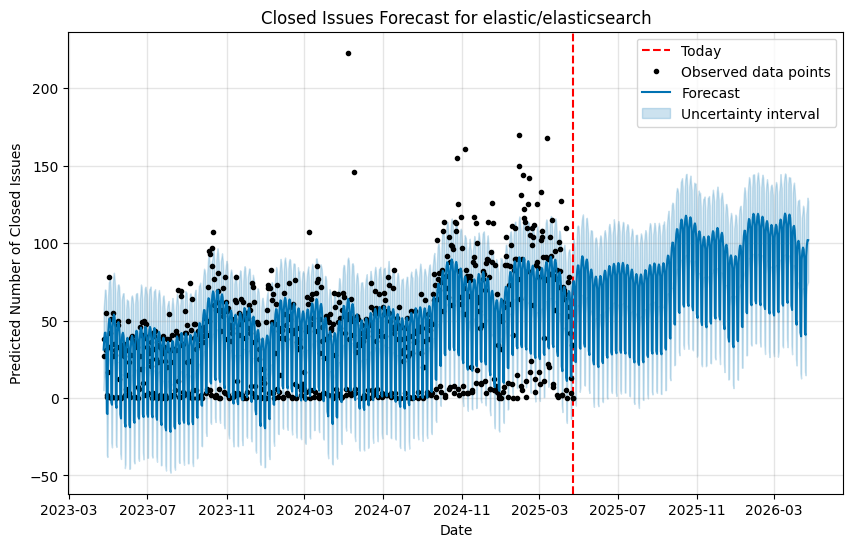

21:44:47 - cmdstanpy - INFO - Chain [1] start processing
21:44:47 - cmdstanpy - INFO - Chain [1] done processing


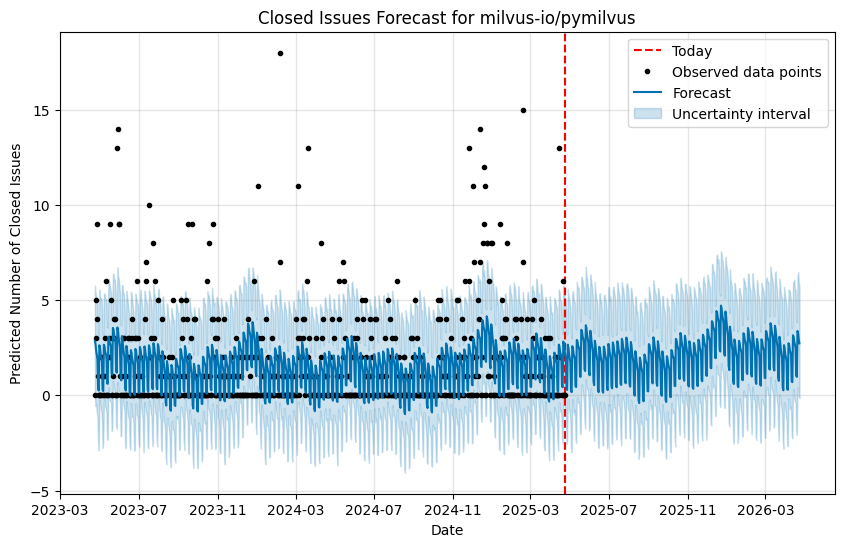

In [9]:
#Add your code for requirement 9.5 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

issuesData = pd.read_csv('dataset/issues_all_repo.csv')

for i in issuesData['repository'].unique():
    repoBasedDf = issuesData[issuesData['repository'] == i].copy()
    
    repoBasedDf['closed_at'] = pd.to_datetime(repoBasedDf['closed_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['closed_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['closed_at'] >= oldDate) & (repoBasedDf['closed_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('closed_at').size().reset_index(name='count')

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['closed_at']
    newRepoData['y'] = repoBasedDfBasedOnDate['count']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    fig, ax = plt.subplots(figsize=(10, 6))

    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    model.plot(oneYearForcast, ax=ax)
    plt.title(f"Closed Issues Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Closed Issues")
    plt.grid(True)
    plt.legend()
    plt.show()


<div class="alert alert-block alert-warning">   
    
#### REQ9-6). Plot the pulls forecast

</div>

21:45:13 - cmdstanpy - INFO - Chain [1] start processing
21:45:13 - cmdstanpy - INFO - Chain [1] done processing


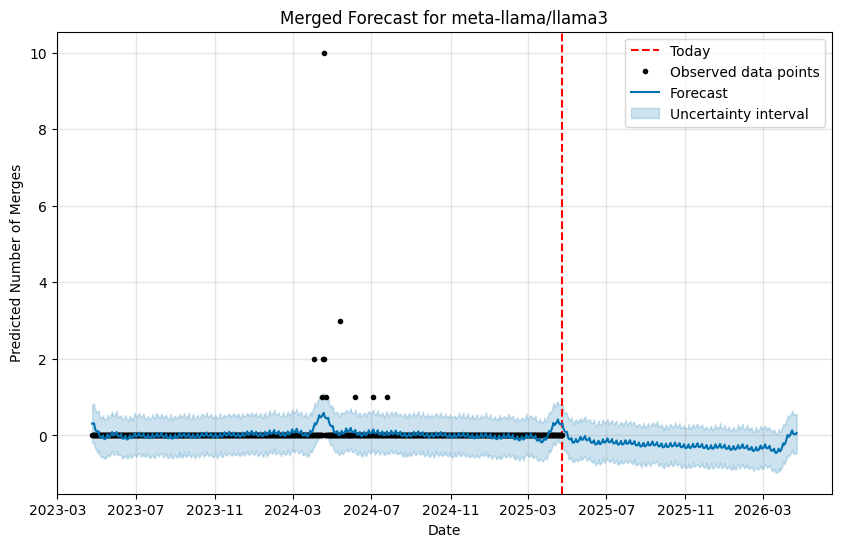

21:45:13 - cmdstanpy - INFO - Chain [1] start processing
21:45:13 - cmdstanpy - INFO - Chain [1] done processing


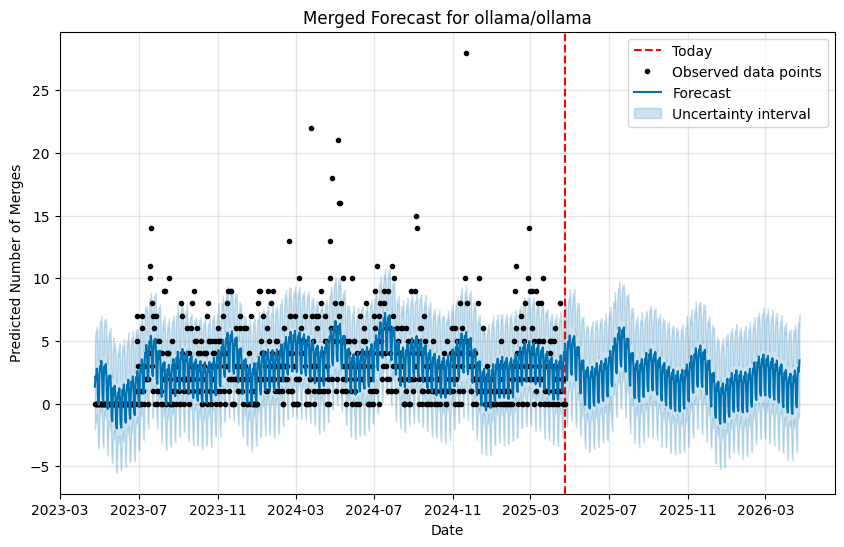

21:45:14 - cmdstanpy - INFO - Chain [1] start processing
21:45:14 - cmdstanpy - INFO - Chain [1] done processing


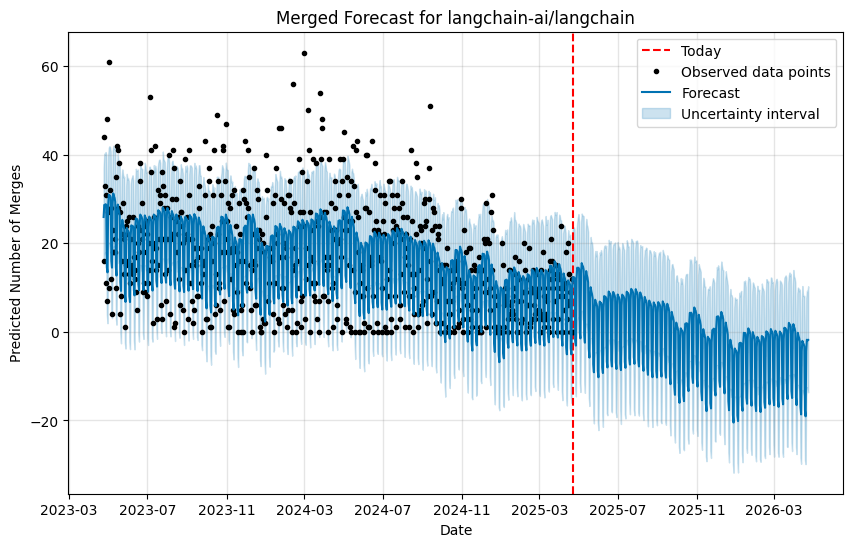

21:45:14 - cmdstanpy - INFO - Chain [1] start processing
21:45:14 - cmdstanpy - INFO - Chain [1] done processing


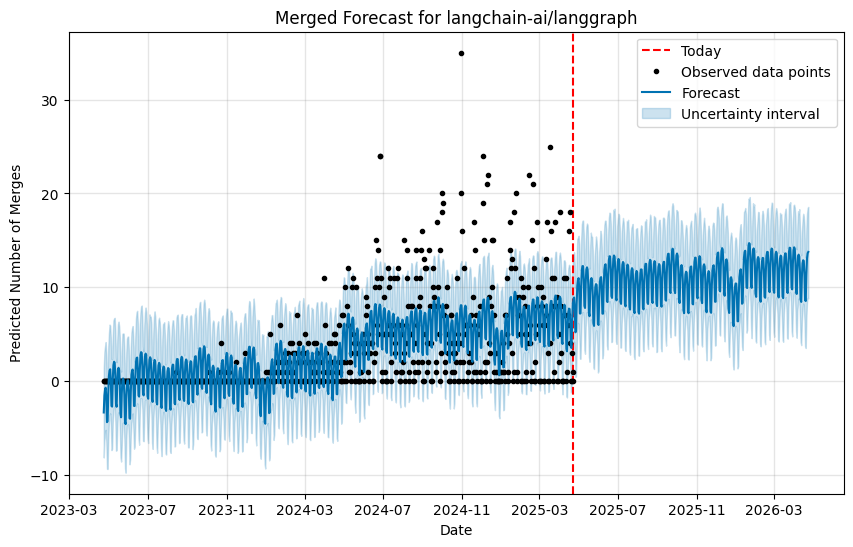

21:45:15 - cmdstanpy - INFO - Chain [1] start processing
21:45:15 - cmdstanpy - INFO - Chain [1] done processing


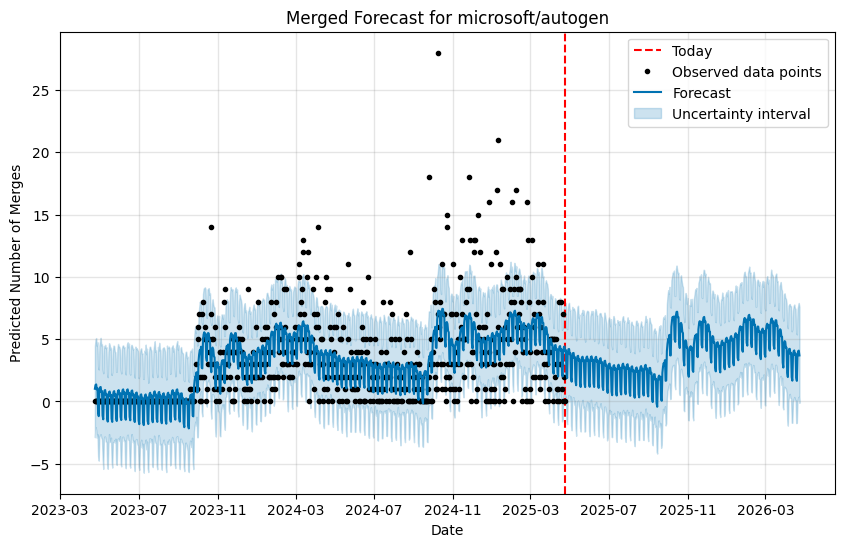

21:45:15 - cmdstanpy - INFO - Chain [1] start processing
21:45:15 - cmdstanpy - INFO - Chain [1] done processing


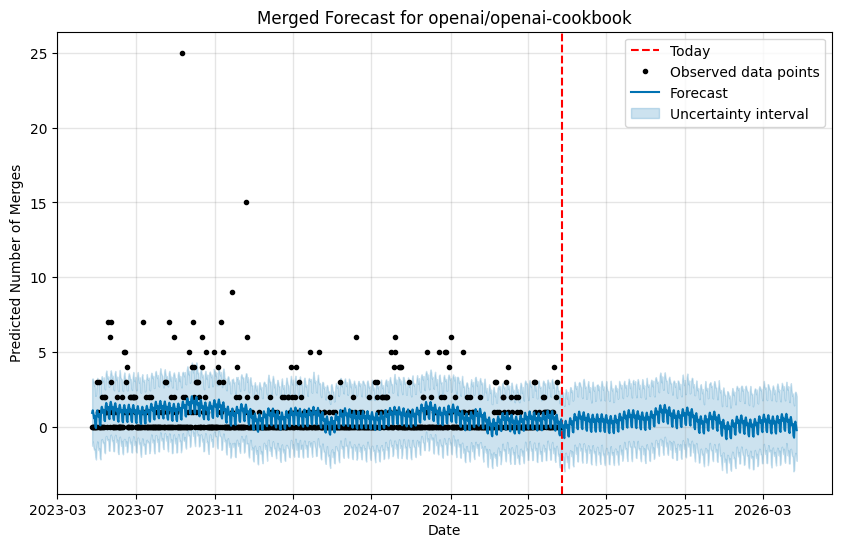

21:45:16 - cmdstanpy - INFO - Chain [1] start processing
21:45:16 - cmdstanpy - INFO - Chain [1] done processing


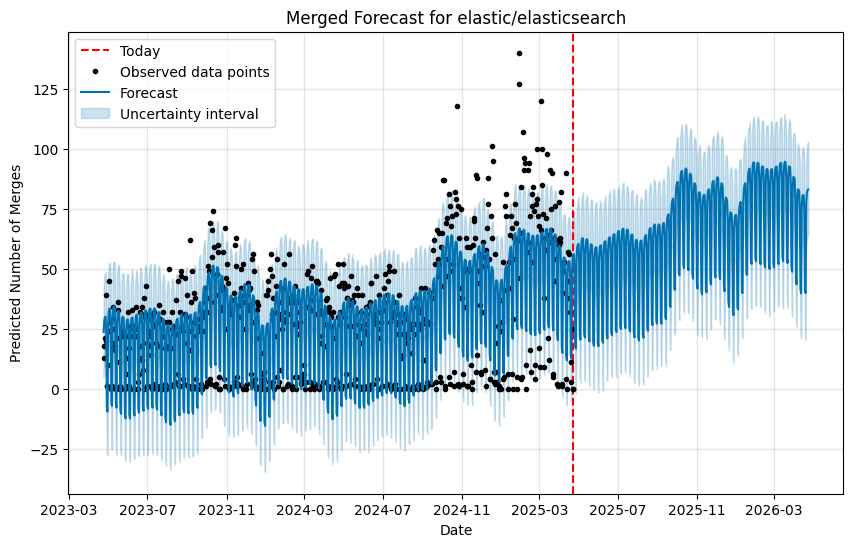

21:45:16 - cmdstanpy - INFO - Chain [1] start processing
21:45:16 - cmdstanpy - INFO - Chain [1] done processing


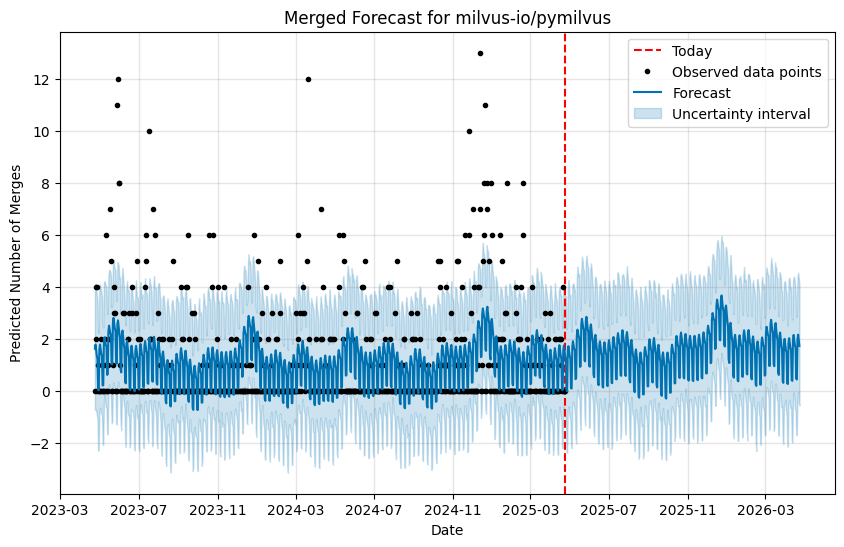

In [11]:
#Add your code for requirement 9.6 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

pullsData = pd.read_csv('dataset/pulls_all_repo.csv')

for i in pullsData['repository'].unique():
    repoBasedDf = pullsData[pullsData['repository'] == i].copy()
    
    repoBasedDf['merged_at'] = pd.to_datetime(repoBasedDf['merged_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['merged_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['merged_at'] >= oldDate) & (repoBasedDf['merged_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('merged_at').size().reset_index(name='count')

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['merged_at']
    newRepoData['y'] = repoBasedDfBasedOnDate['count']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    fig, ax = plt.subplots(figsize=(10, 6))

    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    model.plot(oneYearForcast, ax=ax)
    plt.title(f"Merged Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Merges")
    plt.grid(True)
    plt.legend()
    plt.show()

<div class="alert alert-block alert-warning">   
    
#### REQ9-7). Plot the commits forecast

</div>

21:45:39 - cmdstanpy - INFO - Chain [1] start processing
21:45:39 - cmdstanpy - INFO - Chain [1] done processing


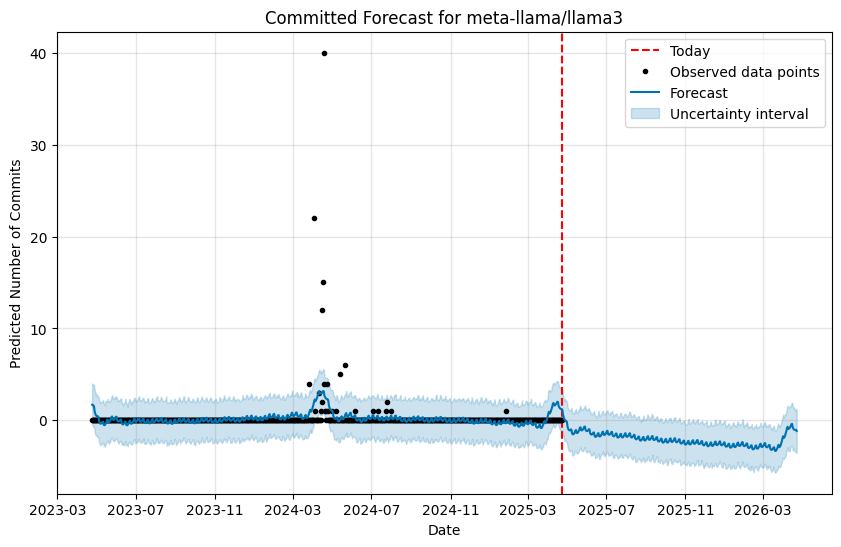

21:45:40 - cmdstanpy - INFO - Chain [1] start processing
21:45:40 - cmdstanpy - INFO - Chain [1] done processing


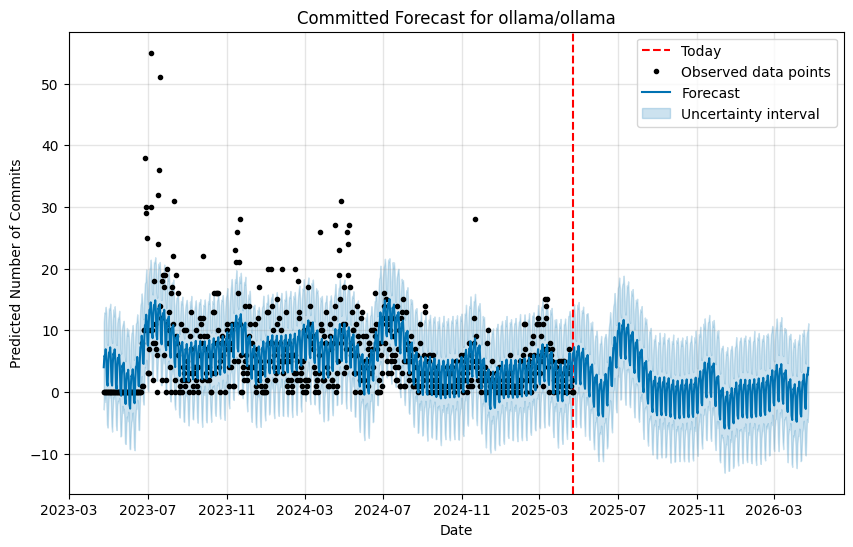

21:45:41 - cmdstanpy - INFO - Chain [1] start processing
21:45:41 - cmdstanpy - INFO - Chain [1] done processing


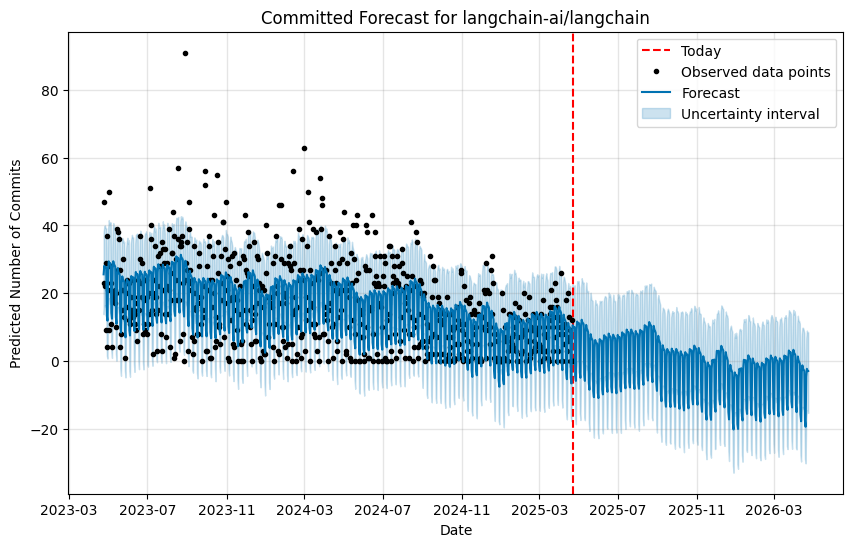

21:45:41 - cmdstanpy - INFO - Chain [1] start processing
21:45:41 - cmdstanpy - INFO - Chain [1] done processing


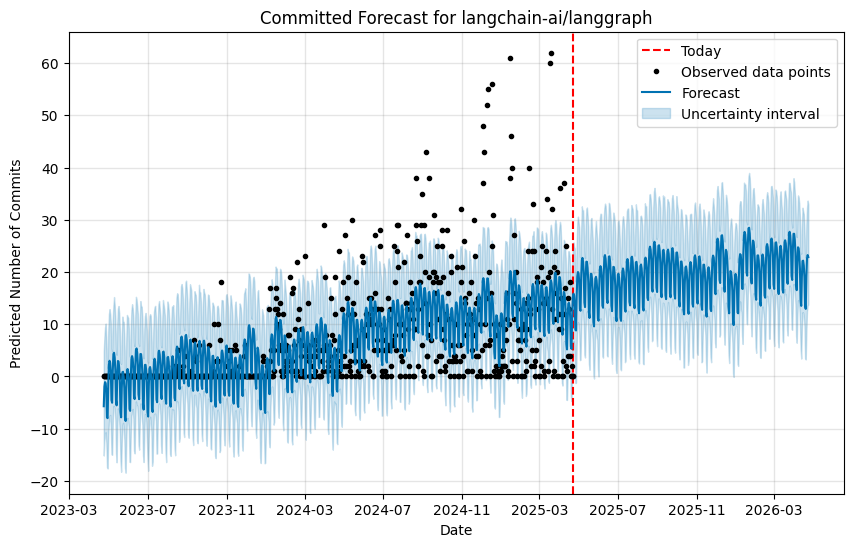

21:45:42 - cmdstanpy - INFO - Chain [1] start processing
21:45:42 - cmdstanpy - INFO - Chain [1] done processing


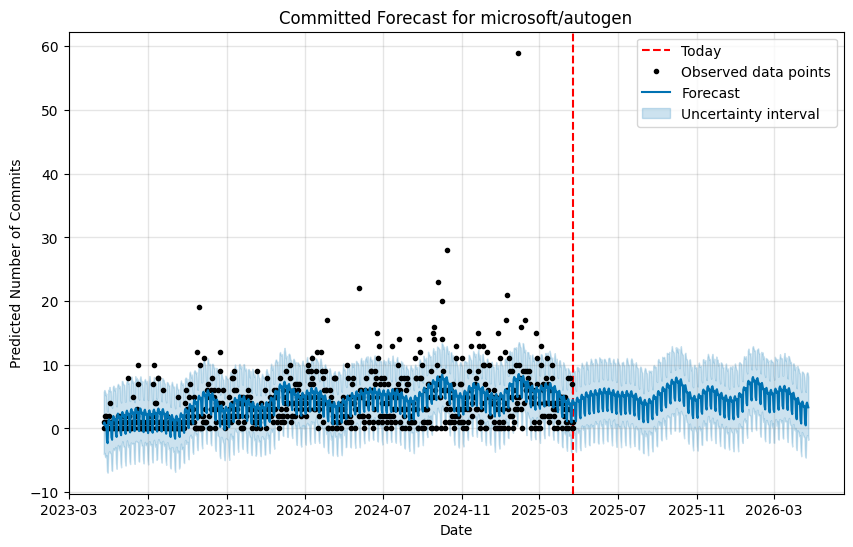

21:45:42 - cmdstanpy - INFO - Chain [1] start processing
21:45:42 - cmdstanpy - INFO - Chain [1] done processing


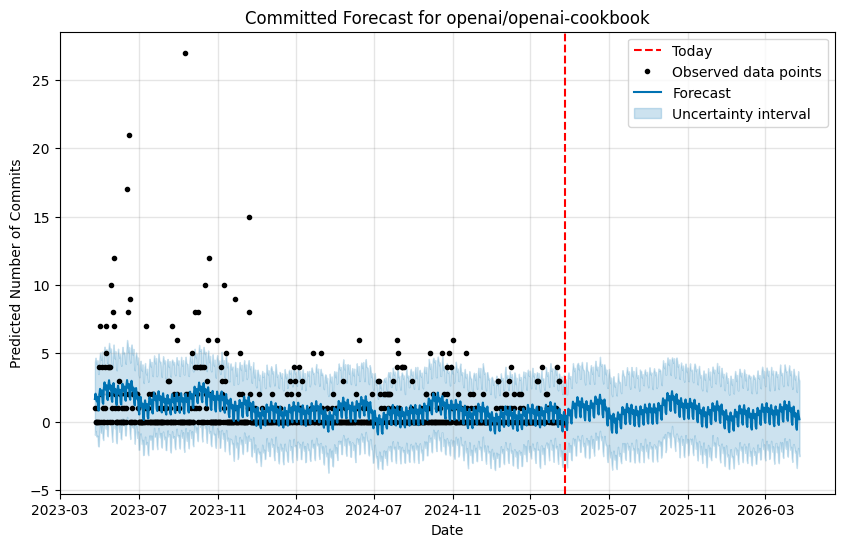

21:45:42 - cmdstanpy - INFO - Chain [1] start processing
21:45:42 - cmdstanpy - INFO - Chain [1] done processing


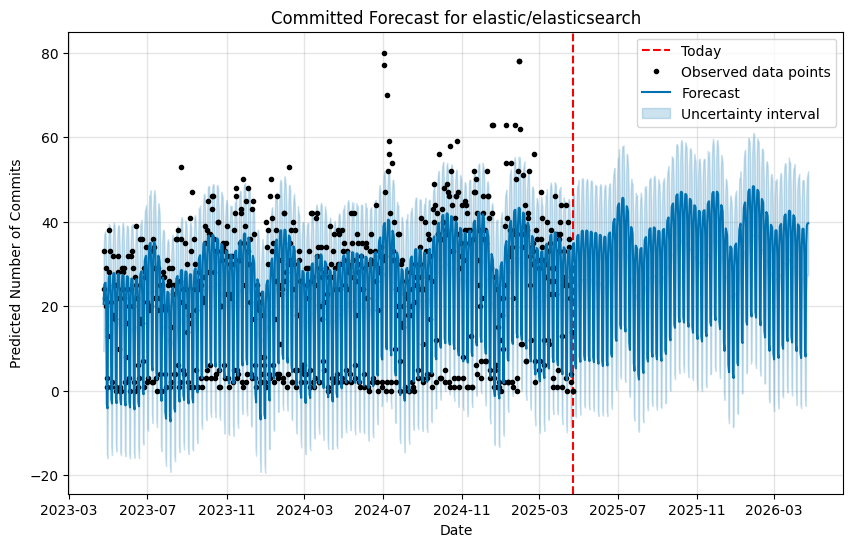

21:45:43 - cmdstanpy - INFO - Chain [1] start processing
21:45:43 - cmdstanpy - INFO - Chain [1] done processing


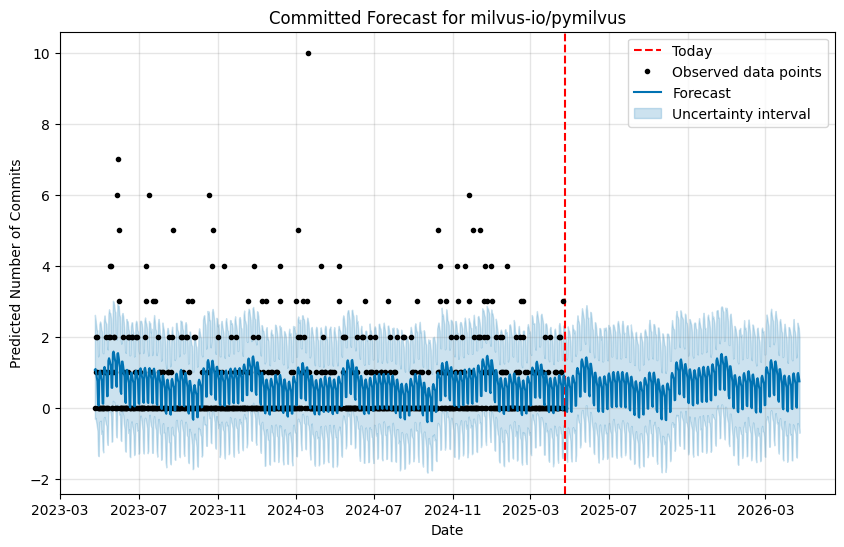

In [13]:
#Add your code for requirement 9.7 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

commitsData = pd.read_csv('dataset/commits_all_repo.csv')

for i in commitsData['repository'].unique():
    repoBasedDf = commitsData[commitsData['repository'] == i].copy()
    
    repoBasedDf['commit_date'] = pd.to_datetime(repoBasedDf['commit_date'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['commit_date'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['commit_date'] >= oldDate) & (repoBasedDf['commit_date'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('commit_date').size().reset_index(name='count')

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['commit_date']
    newRepoData['y'] = repoBasedDfBasedOnDate['count']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    fig, ax = plt.subplots(figsize=(10, 6))

    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    model.plot(oneYearForcast, ax=ax)
    plt.title(f"Committed Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Commits")
    plt.grid(True)
    plt.legend()
    plt.show()

<div class="alert alert-block alert-warning">   
    
#### REQ9-8). Plot the branches forecast

</div>

21:45:50 - cmdstanpy - INFO - Chain [1] start processing
21:45:50 - cmdstanpy - INFO - Chain [1] done processing


          repository               repo          branch_name  \
0  meta-llama/llama3  meta-llama/llama3  gh/HDCharles/1/base   
1  meta-llama/llama3  meta-llama/llama3  gh/HDCharles/1/head   
2  meta-llama/llama3  meta-llama/llama3  gh/HDCharles/1/orig   
3  meta-llama/llama3  meta-llama/llama3  gh/HDCharles/2/base   
4  meta-llama/llama3  meta-llama/llama3  gh/HDCharles/2/head   

                           branch_commit_id          commit_date  
0  fa87cc3601463f3d0dce6b081e111865e362b622  2024-04-05 00:24:41  
1  d6a2e3cf19b22ccfbb03e4d3d23ca1853a03f954  2024-04-10 22:57:57  
2  340d732d4eff2f8c26c8b34c6297388138d3857e  2024-04-10 22:57:58  
3  d6a2e3cf19b22ccfbb03e4d3d23ca1853a03f954  2024-04-10 22:57:57  
4  609935caf1e6347cad86576496c69a2a98721e38  2024-04-10 23:11:48  


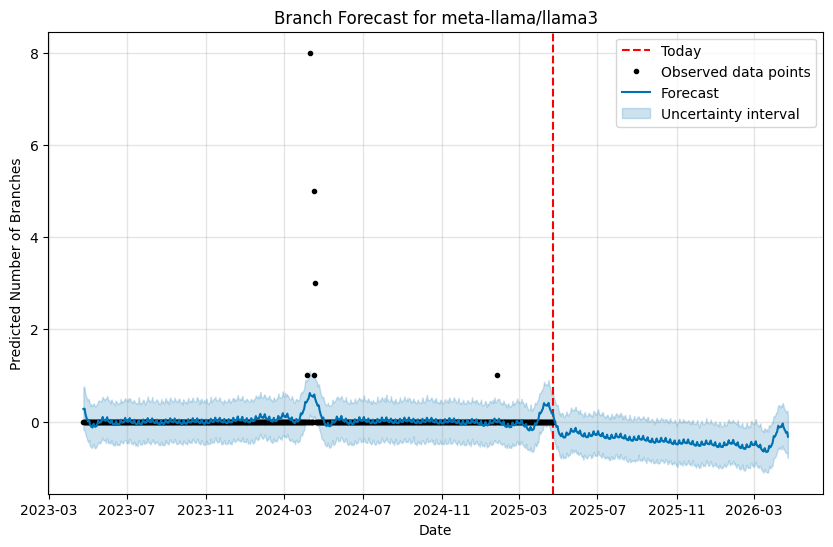

21:45:50 - cmdstanpy - INFO - Chain [1] start processing
21:45:50 - cmdstanpy - INFO - Chain [1] done processing


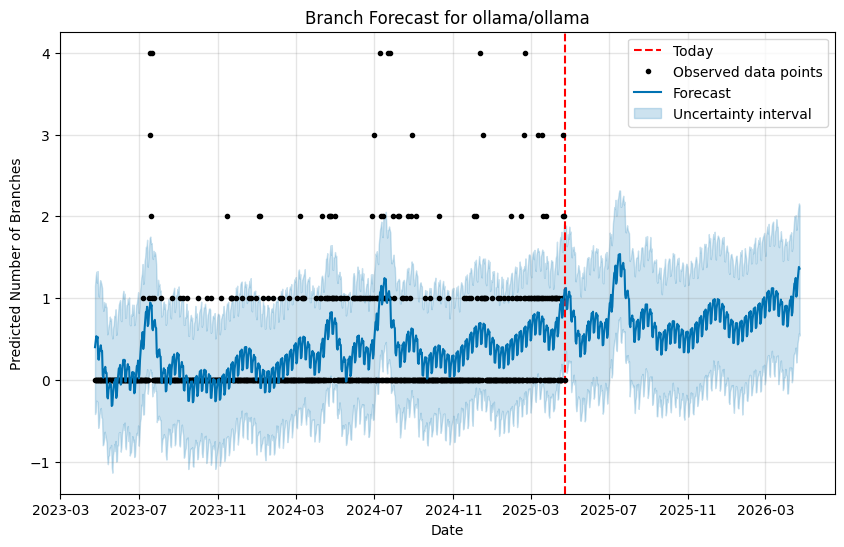

21:45:51 - cmdstanpy - INFO - Chain [1] start processing
21:45:51 - cmdstanpy - INFO - Chain [1] done processing


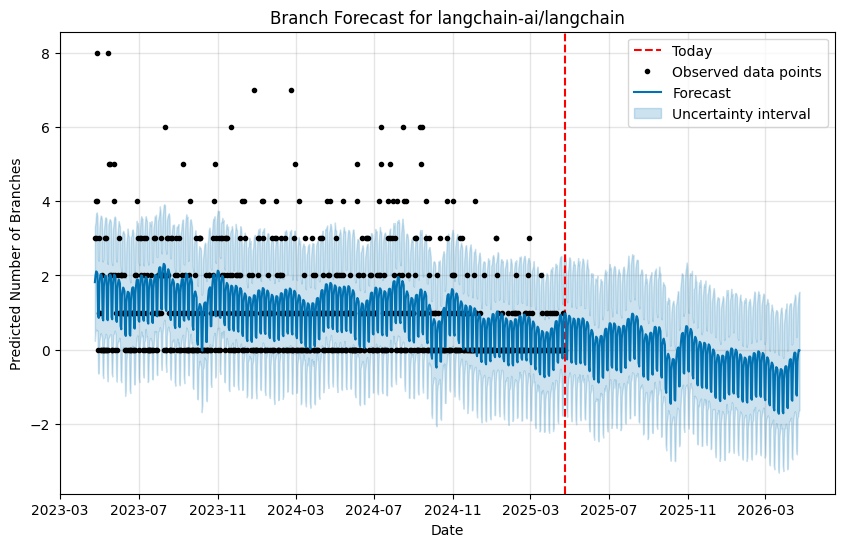

21:45:51 - cmdstanpy - INFO - Chain [1] start processing
21:45:51 - cmdstanpy - INFO - Chain [1] done processing


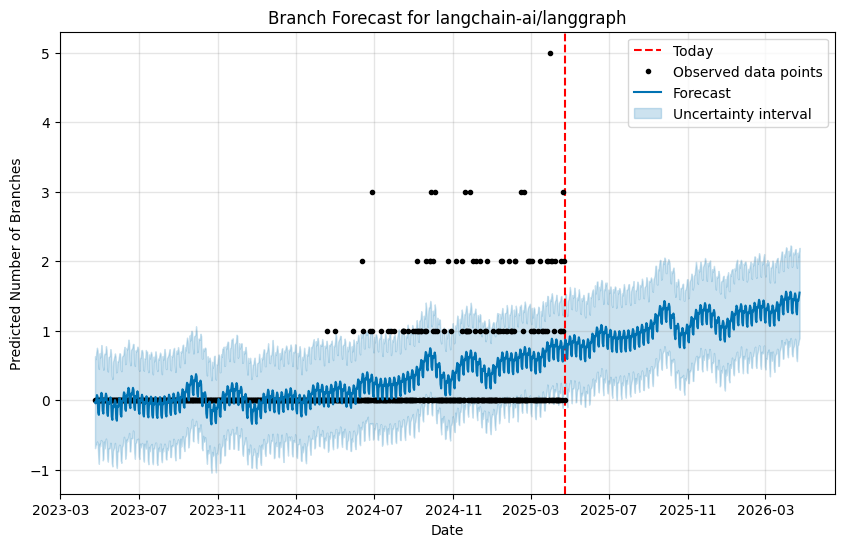

21:45:52 - cmdstanpy - INFO - Chain [1] start processing
21:45:52 - cmdstanpy - INFO - Chain [1] done processing


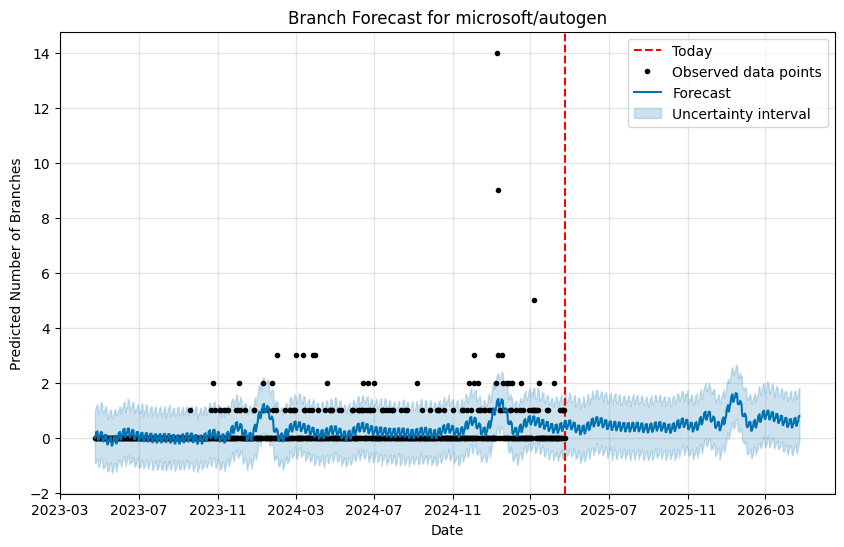

21:45:52 - cmdstanpy - INFO - Chain [1] start processing
21:45:52 - cmdstanpy - INFO - Chain [1] done processing


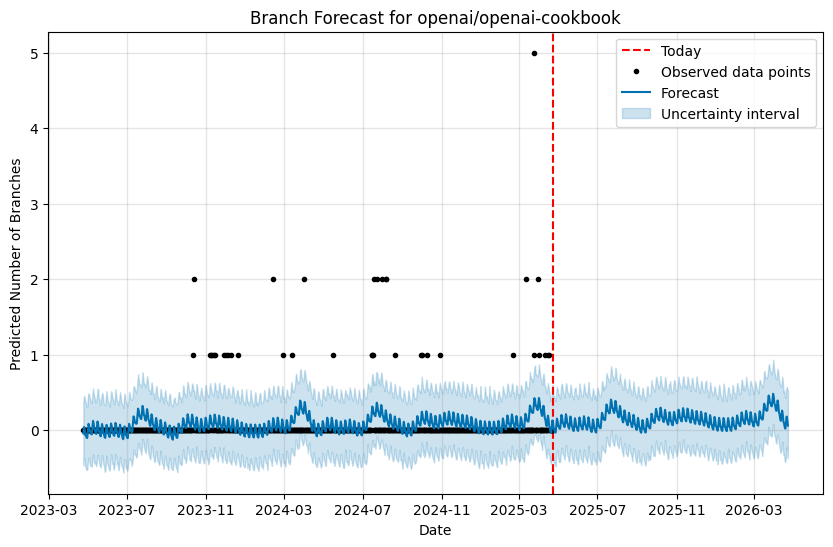

21:45:52 - cmdstanpy - INFO - Chain [1] start processing
21:45:53 - cmdstanpy - INFO - Chain [1] done processing


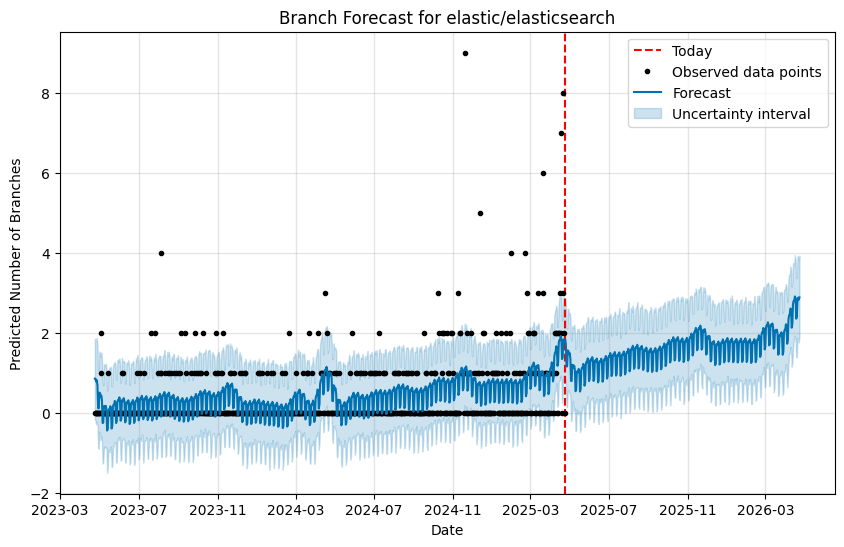

21:45:53 - cmdstanpy - INFO - Chain [1] start processing
21:45:53 - cmdstanpy - INFO - Chain [1] done processing


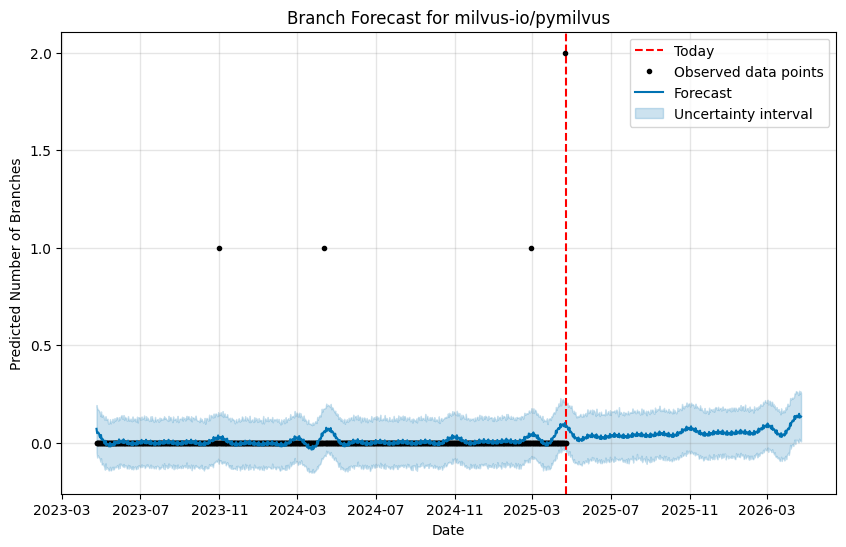

In [14]:
#Add your code for requirement 9.8 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

branchedData = pd.read_csv('dataset/branches_all_repo.csv')
print(branchedData.head())
for i in branchedData['repository'].unique():
    repoBasedDf = branchedData[branchedData['repository'] == i].copy()
    
    repoBasedDf['commit_date'] = pd.to_datetime(repoBasedDf['commit_date'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['commit_date'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['commit_date'] >= oldDate) & (repoBasedDf['commit_date'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('commit_date').size().reset_index(name='count')

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['commit_date']
    newRepoData['y'] = repoBasedDfBasedOnDate['count']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    fig, ax = plt.subplots(figsize=(10, 6))

    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    model.plot(oneYearForcast, ax=ax)
    plt.title(f"Branch Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Branches")
    plt.grid(True)
    plt.legend()
    plt.show()

<div class="alert alert-block alert-warning">   
    
#### REQ9-9). Plot the contributors forecast

</div>

21:47:10 - cmdstanpy - INFO - Chain [1] start processing
21:47:10 - cmdstanpy - INFO - Chain [1] done processing


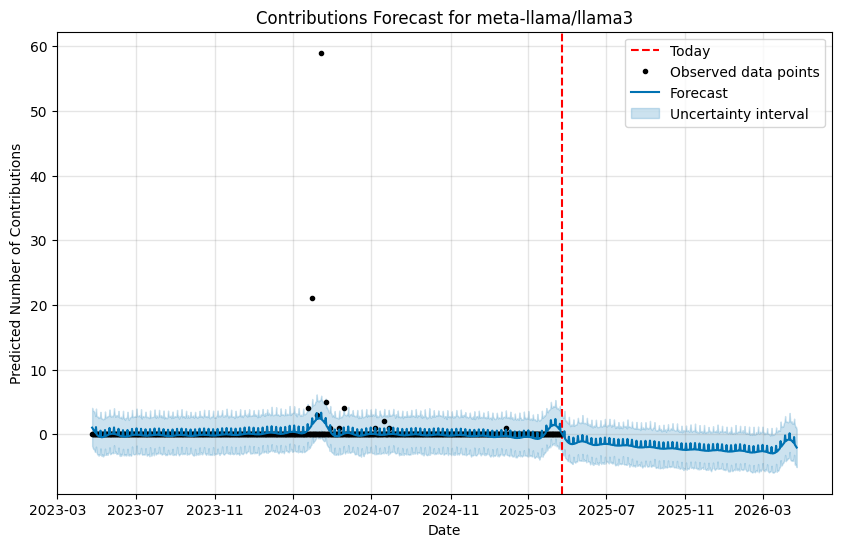

21:47:11 - cmdstanpy - INFO - Chain [1] start processing
21:47:11 - cmdstanpy - INFO - Chain [1] done processing


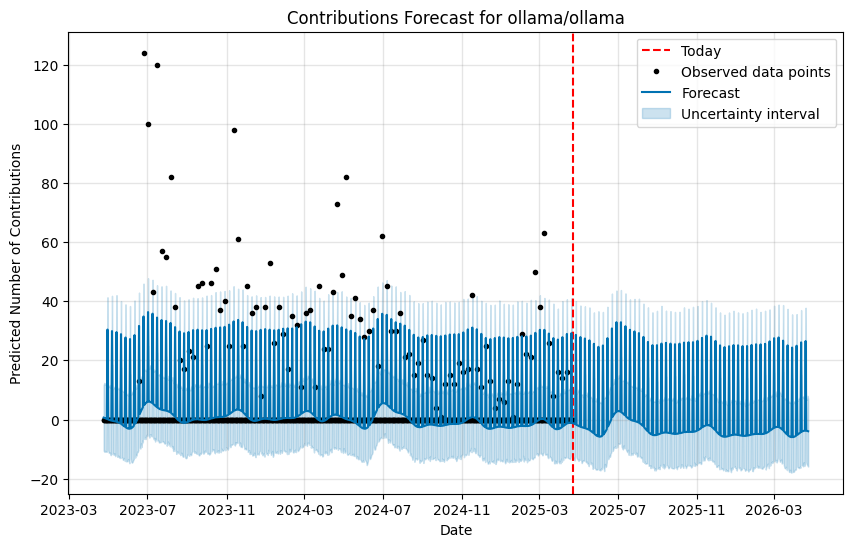

21:47:11 - cmdstanpy - INFO - Chain [1] start processing
21:47:11 - cmdstanpy - INFO - Chain [1] done processing


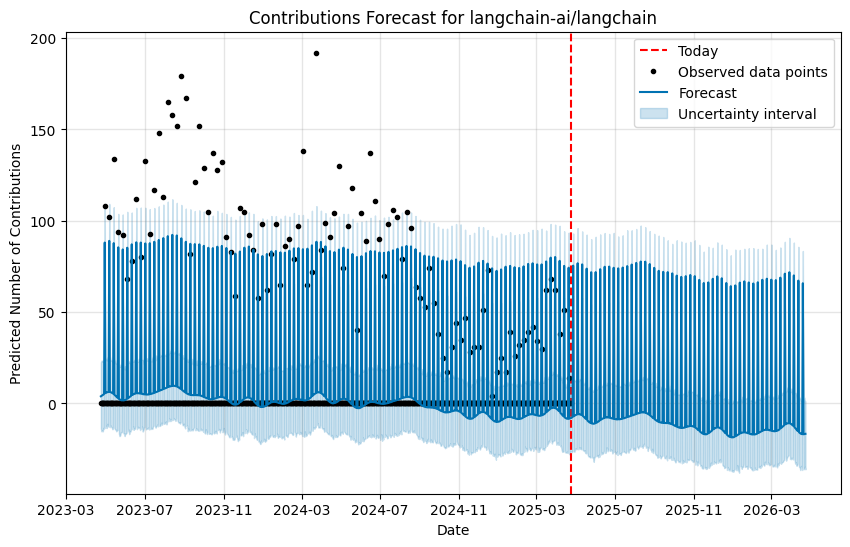

21:47:11 - cmdstanpy - INFO - Chain [1] start processing
21:47:11 - cmdstanpy - INFO - Chain [1] done processing


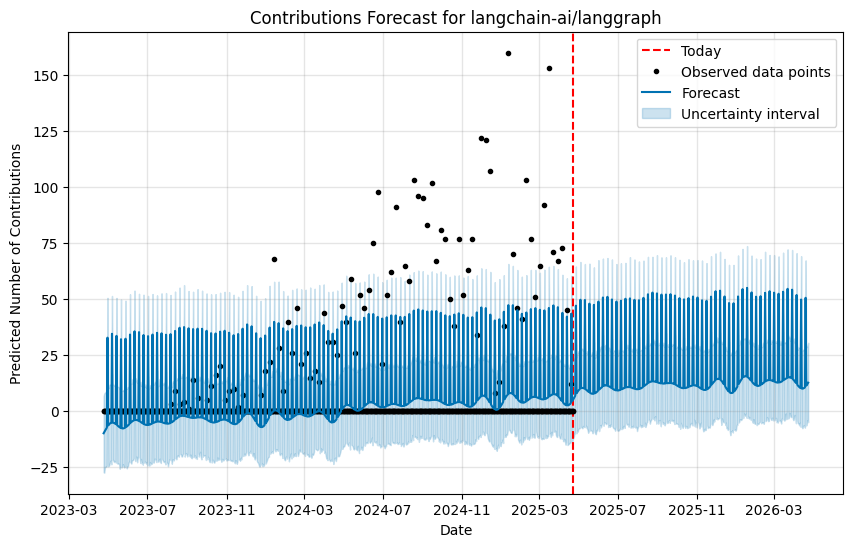

21:47:12 - cmdstanpy - INFO - Chain [1] start processing
21:47:12 - cmdstanpy - INFO - Chain [1] done processing


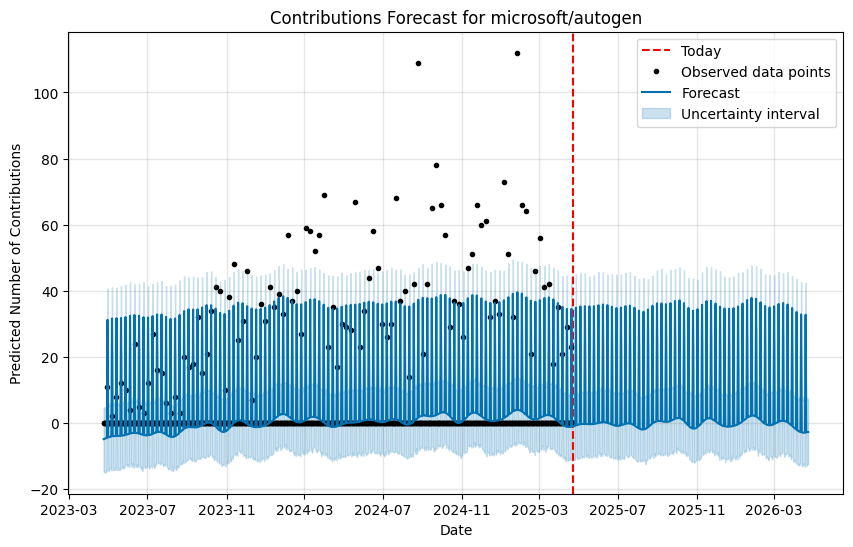

21:47:12 - cmdstanpy - INFO - Chain [1] start processing
21:47:12 - cmdstanpy - INFO - Chain [1] done processing


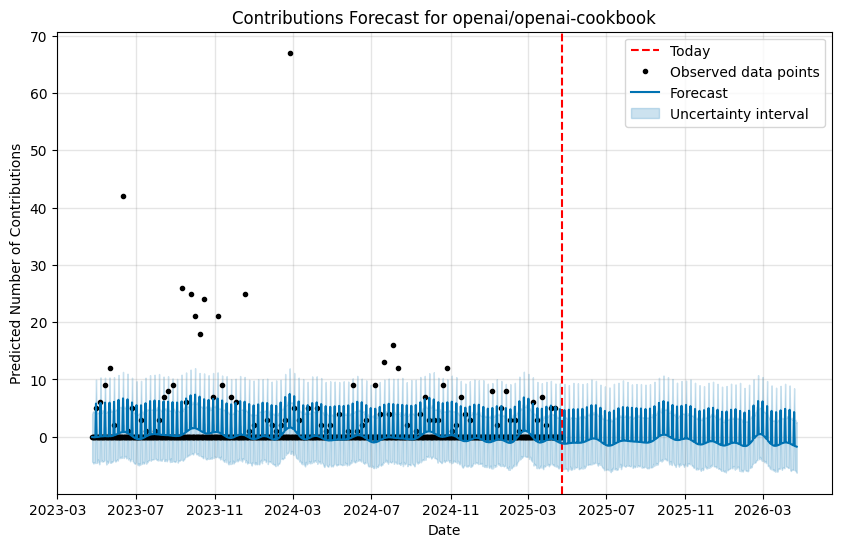

21:47:13 - cmdstanpy - INFO - Chain [1] start processing
21:47:13 - cmdstanpy - INFO - Chain [1] done processing


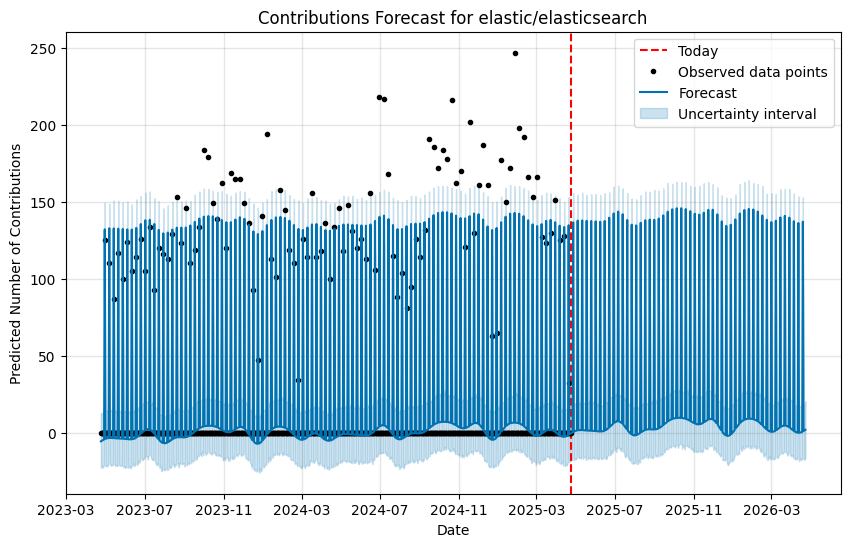

21:47:13 - cmdstanpy - INFO - Chain [1] start processing
21:47:13 - cmdstanpy - INFO - Chain [1] done processing


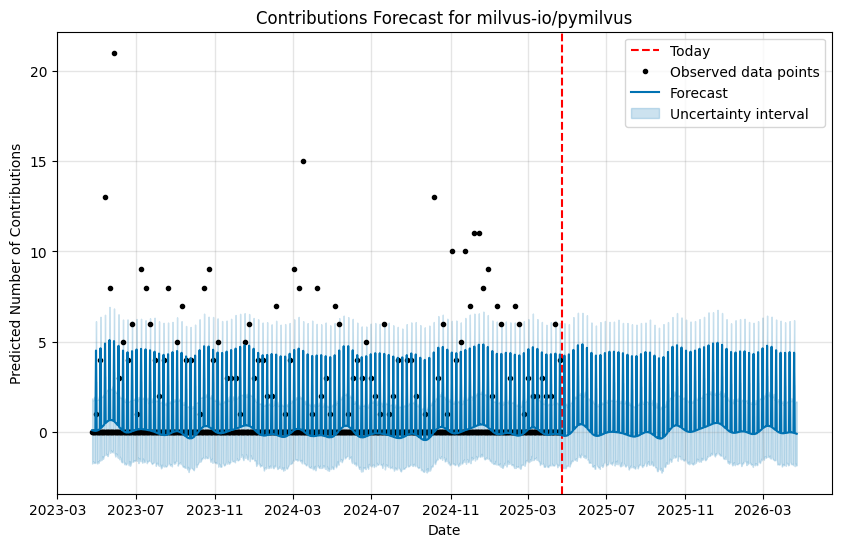

In [16]:
#Add your code for requirement 9.9 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

contributorsData = pd.read_csv('dataset/all_repo_contributors.csv')

for i in contributorsData['Repository'].unique():
    repoBasedDf = contributorsData[contributorsData['Repository'] == i].copy()
    
    repoBasedDf['date'] = pd.to_datetime(repoBasedDf['date'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['date'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['date'] >= oldDate) & (repoBasedDf['date'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf 

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['date']
    newRepoData['y'] = repoBasedDfBasedOnDate['commitCount']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    fig, ax = plt.subplots(figsize=(10, 6))

    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    model.plot(oneYearForcast, ax=ax)
    plt.title(f"Contributions Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Contributions")
    plt.grid(True)
    plt.legend()
    plt.show()

<div class="alert alert-block alert-warning">   
    
#### REQ9-10). Plot the releases forecast

</div>

21:47:34 - cmdstanpy - INFO - Chain [1] start processing
21:47:34 - cmdstanpy - INFO - Chain [1] done processing


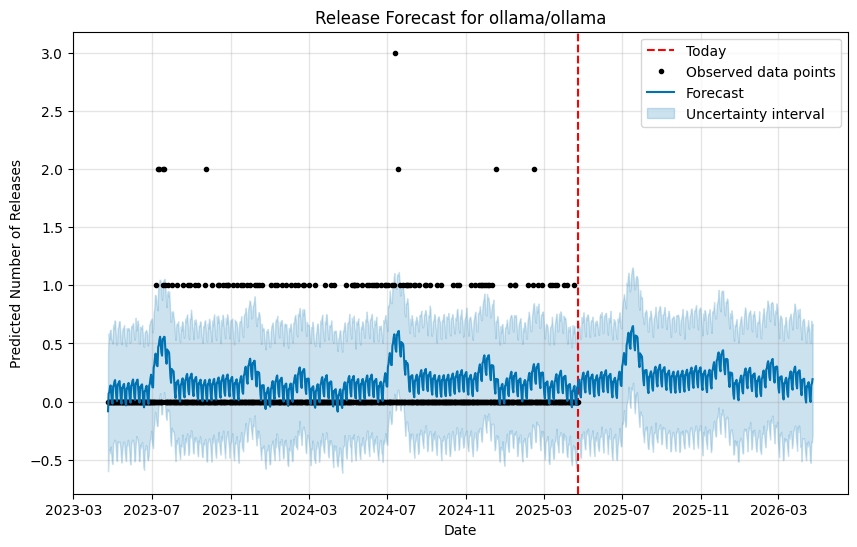

21:47:34 - cmdstanpy - INFO - Chain [1] start processing
21:47:34 - cmdstanpy - INFO - Chain [1] done processing


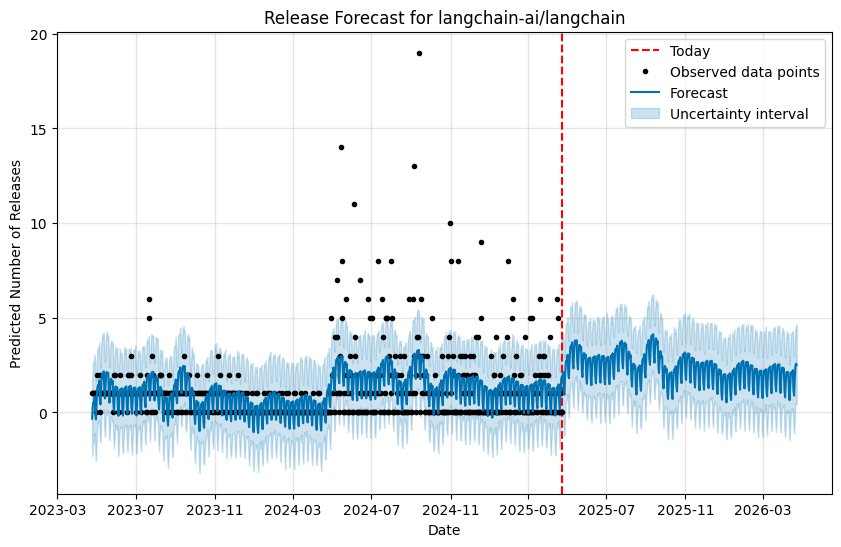

21:47:35 - cmdstanpy - INFO - Chain [1] start processing
21:47:35 - cmdstanpy - INFO - Chain [1] done processing


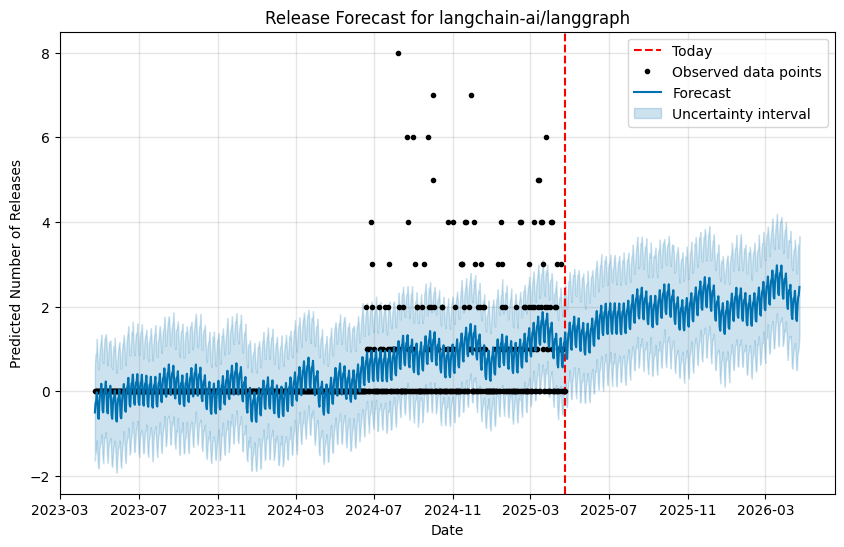

21:47:35 - cmdstanpy - INFO - Chain [1] start processing
21:47:35 - cmdstanpy - INFO - Chain [1] done processing


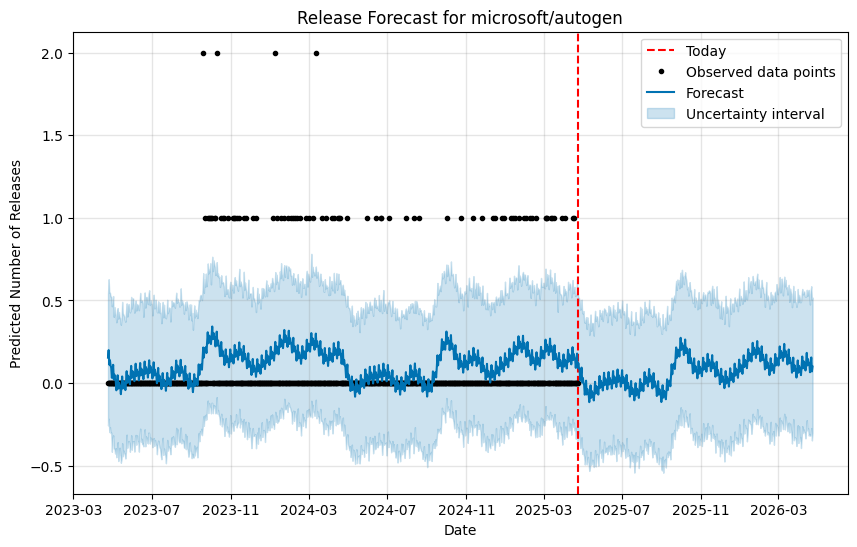

21:47:35 - cmdstanpy - INFO - Chain [1] start processing
21:47:35 - cmdstanpy - INFO - Chain [1] done processing


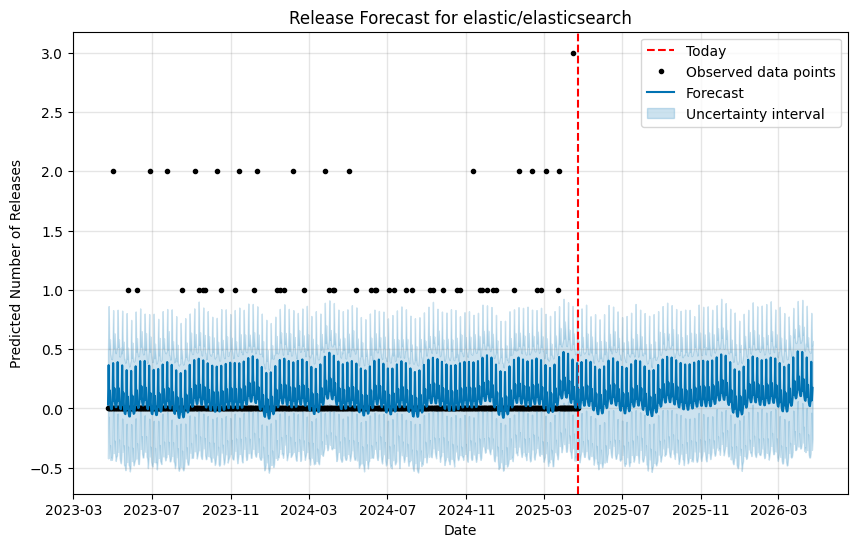

21:47:36 - cmdstanpy - INFO - Chain [1] start processing
21:47:36 - cmdstanpy - INFO - Chain [1] done processing


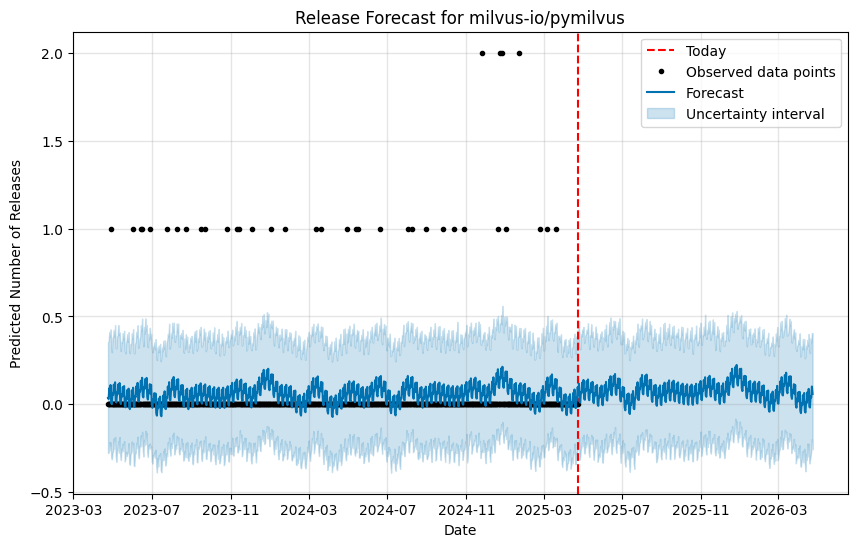

In [17]:
#Add your code for requirement 9.10 in this cell

import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from prophet import Prophet
import pytz

nowDate = datetime.now(pytz.UTC).date()
oldDate = (datetime.now(pytz.UTC) - timedelta(days=730)).date()

releasesData = pd.read_csv('dataset/releases_all_repo.csv')

for i in releasesData['repository'].unique():
    repoBasedDf = releasesData[releasesData['repository'] == i].copy()
    
    repoBasedDf['published_at'] = pd.to_datetime(repoBasedDf['published_at'], errors='coerce').dt.date
    repoBasedDf = repoBasedDf.dropna(subset=['published_at'])    
    repoBasedDf = repoBasedDf[(repoBasedDf['published_at'] >= oldDate) & (repoBasedDf['published_at'] <= nowDate)]
    
    repoBasedDfBasedOnDate = repoBasedDf.groupby('published_at').size().reset_index(name='count')

    newRepoData = pd.DataFrame()
    newRepoData['ds'] = repoBasedDfBasedOnDate['published_at']
    newRepoData['y'] = repoBasedDfBasedOnDate['count']

    allDates = pd.date_range(start=oldDate, end=nowDate, freq='D')
    newRepoData = newRepoData.set_index('ds').reindex(allDates, fill_value=0).reset_index()

    newRepoData = newRepoData.rename(columns={'index': 'ds'})
    
    model = Prophet()
    model.fit(newRepoData)

    oneYearFuture = model.make_future_dataframe(periods = 365)
    oneYearForcast = model.predict(oneYearFuture)

    fig, ax = plt.subplots(figsize=(10, 6))

    today = pd.Timestamp.today()
    tomorrow = today + pd.Timedelta(days=0)
    ax.axvline(x=tomorrow, color='red', linestyle='--', label='Today')

    model.plot(oneYearForcast, ax=ax)
    plt.title(f"Release Forecast for {i}")
    plt.xlabel("Date")
    plt.ylabel("Predicted Number of Releases")
    plt.grid(True)
    plt.legend()
    plt.show()